FBL Sensitivity Study
===



>[FBL Sensitivity Study](#scrollTo=FxauQE5vUyT3)

>[Instructions](#scrollTo=nxDfnay8kFMf)

>[Setup and Import blocks](#scrollTo=NrawFtaQkfnz)

>[Setup config options, basic kites, and environment](#scrollTo=6F23No9RRVnO)

>[Set up kite configs](#scrollTo=p4h6YoWw-kD-)

>[Sensitivity Sweep](#scrollTo=e3h_N2NYZ9C4)

>>[Sweep Variables](#scrollTo=01ez4RrOaLsf)

>[Postprocess/export power curve data](#scrollTo=Les-2judhqWd)

>[Load in params and regen power curves](#scrollTo=60wHeRvvh2wj)

>[Plot Results](#scrollTo=hlBGoziqbZ9A)



# Instructions



1.   Start a local jupyter server runtime in your mx_sys folder

```
jupyter notebook --NotebookApp.allow_origin='https://colab.sandbox.google.com' --port=8888 --NotebookApp.port_retries=0
```

[Full instructions](https://research.google.com/colaboratory/local-runtimes.html) (but instead of using colab.research, use colab.sandbox (Google recognizes we're internal and redirects us.)

Note: first time only, you may need to install and enable the jupyter_http_over_ws jupyter extension: 

  `pip install jupyter_http_over_ws`

  `jupyter serverextension enable --py jupyter_http_over_ws`




# Setup and Import blocks

In [ ]:
#@title Python import block
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import six
from six.moves import range
from six.moves import zip

from IPython.display import clear_output

import numpy as np
import os
import scipy
from scipy import interpolate
import math
import json
from pprint import pprint as pp
import time
import copy
from matplotlib import pyplot as plt
from matplotlib import cm
import multiprocessing
from cycler import cycler
import itertools
import pandas as pd
import cProfile
import csv
import inspect
import IPython
import traceback
import datetime
import pytz

import sys
sys.path.insert(0, '../../')
sys.path.insert(0, '../')

%matplotlib inline



In [ ]:
#@title FBL import block

# from makani.lib.python import struct_tree

from mx_sys.power_calcs import power_calcs as makani_FBL
from mx_sys.power_calcs import kite_pose
from mx_sys.power_calcs import kite_loop
from mx_sys.power_calcs import kite_path
from mx_sys.power_calcs import utils
from lib import fun

# things for AEP tools
from lib import params
from mx_sys import const
from mx_sys import model
from mx_sys import AWE_sys
from mx_sys.plant_sys import plant
from mx_sys import econ
from mx_sys import resource as mx_resource

from tools import m600_fbl_config_manager as configs
from tools import resource_fbl_manager as resources
from tools import  fbl_load_csim_database

import sys
python_version = sys.version[0]
if python_version == '3':
  import importlib
  importlib.reload(makani_FBL)
  importlib.reload(configs)
  importlib.reload(resources)
  importlib.reload(kite_pose)
  importlib.reload(kite_path)
  importlib.reload(kite_loop)
  importlib.reload(utils)
  importlib.reload(fun)
elif python_version == '2':
  reload(makani_FBL)
  reload(configs)
  reload(resources)
  reload(kite_pose)
  reload(kite_path)
  reload(kite_loop)
  reload(utils)
  reload(fun)


In [ ]:
#@title FBL utils def block { form-width: "20%"}
def SolveAepCapFactor(pc, resource):
  # Set up mx_resource obj
  resource_params = model.Spec('inputs/nom_resource.yaml')

  nom_resource = mx_resource.Resource()
  nom_resource.Populate(resource_params)
  nom_resource.shear = resource['shear']
  nom_resource.v_w_avg_h_ref = resource['v_w_avg_h_ref']
  nom_resource.rho = resource['rho']

  prob_dist = nom_resource.make_v_w_prob_dist(pc.v_ws_at_h_ref)

  AEP = plant.calc_AEP(prob_dist, pc, pc.p_rated)[0]
  cap_factor = AEP * 1000000./const.hrs_per_yr/pc.p_rated

  return AEP, cap_factor

class PowerCurveProcessor(object):
  def __init__(self):
    self.jobs = []
  def create_jobs_from_items_to_vary(self,
      baseline_resource_kwargs, baseline_pc_solve_kwargs, baseline_override,
      items_to_vary, **kwargs):
    """Builds list of jobs for a sensitivity sweep from some baseline inputs and
    list of items to vary.
    
    Args:
      baseline_resource_kwargs: Dict defining the resource.
      baseline_pc_solve_kwargs: Dict of KitePowerCurve object kwargs. Defines
        things like optimization options, partial solutions, etc. See
        mx_modeling.mx_sys.power_calcs for documentation.
      baseline_override: Dict of baseline kite overrides. This is converted to a
        kite config of the format required for the KitePowerCurve object.
      items_to_vary: List of items to vary. Format is:
        [{'batch_id': <string_used_as_identification_for_set_of_jobs>,
          'vars_to_sweep': [[<path_in_nested_dict_to_first_variable>],
                            [<path_in_nested_dict_to_second_variable>], ...]
          'type': [<'multiply' or 'offset' or 'set' for each variable in sweep>],
          'range_to_vary': [[<values_to_use_for_first_var>],
                            [<values_to_use_for_second_var>], ...]},...]

    Path structure for baseline items is:
      {'resource_kwargs': baseline_resource_kwargs,
       'pc_solve_kwargs': baseline_pc_solve_kwargs,
       'override': baseline_override}

    Example Usage of items_to_vary:
      The following example sets up a sweep of CG x location, resource air
      density, and optimization tolerance:

      {'batch_id': 'bridle_sweep_mass',
       'vars_to_sweep': [['override', 'CG', 0],
                         ['resource', 'rho'],
                         ['pc_solve_kwargs', 'opt_params', 'tol']],
       'type': ['multiply', 'offset', 'set'],
       'range_to_vary': [[0.8, 1.1], # Values are multiplied with baseline mass
                         [-0.01, 0.01], # Values offset baseline air density.
                         [0.001, 0.00001]]} # Values set optimization tolerance.
    """
    baseline_solution = kwargs.get('baseline_solution', {})

    # Storing converge data explictly turned off to save on memory usage.
    fun.nested_dict_update(
        ['opt_params','store_converge_data'], False, baseline_pc_solve_kwargs,
        make_path=True)

    job_setup_dict_baseline = {
        'resource_kwargs': baseline_resource_kwargs,
        'pc_solve_kwargs': baseline_pc_solve_kwargs,
        'override': baseline_override,
        'solution': baseline_solution,
        'batch_id': 'baseline'}
    self.jobs.append(PowerCurveJob(**job_setup_dict_baseline))

    type_lookup = {
        'multiply': lambda x, v: x * v,
        'offset': lambda x, v: x + v,
        'set': lambda x, v: v}

    # Setup jobs
    for batch_idx, batch in enumerate(items_to_vary):
      for ii, vals in enumerate(zip(*batch['range_to_vary'])):
        temp_job_setup_dict = {
          'batch_id': batch.get('batch_id', batch_idx),
          'resource_kwargs': utils.deepcopy_lite(baseline_resource_kwargs),
          'pc_solve_kwargs': utils.deepcopy_lite(baseline_pc_solve_kwargs),
          'override': utils.deepcopy_lite(baseline_override),
          'solution': utils.deepcopy_lite(batch.get('solution', {})),
          'range_vals': vals,
          'range_names': [],
          'range_types': batch['type'],
          'range_paths': batch['vars_to_sweep'],
          'modified_vals': []} 
        for jj, val in enumerate(vals):
          path = batch['vars_to_sweep'][jj]
          name = '-'.join([str(p) for p in path])
          temp_job_setup_dict['range_names'].append(name)
          typ = batch['type'][jj]
          # If path doesn't exist in things provided, then make it.
          fun.nested_dict_make_path(path, temp_job_setup_dict)
          # Modify the current value
          temp_val = type_lookup[typ](
              fun.nested_dict_traverse(path, temp_job_setup_dict), val)
          temp_job_setup_dict['modified_vals'].append(temp_val)
          fun.nested_dict_update(path, temp_val, temp_job_setup_dict)
        self.jobs.append(PowerCurveJob(**temp_job_setup_dict))

  def print_jobs(self, keys, return_df=True):
    """Returns either a pandas Dataframe of requested keys, or prints a list of
    lists. If run in a notebook, a Dataframe creates a nicely formatted table
    and is the preferred method.

    A key can also be a path to a nested item in result. For example, to access
    AEP, provide ['data', 'pc', 'AEP'] as an item in keys.
    """
    keys = ['batch_id'] + keys
    print_table = []
    for job in self.jobs:
      row = []
      for k in keys:
        if hasattr(k, '__iter__') and type(k) is not str:
          try:
            row.append(fun.nested_dict_traverse(k, job.result))
          except KeyError:
            row.append('-')
        else:
          row.append(job.result.get(k, '-'))
      print_table.append(row)
    columns = ['_'.join(k) if (hasattr(k, '__iter__') and type(k) is not str) else k for k in keys]

    if return_df:
      df = pd.DataFrame(print_table, columns=columns)
      pd.set_option('display.max_colwidth', -1)
      pd.set_option('display.max_rows', None)
      return df
    else:
      fmt = '{} | ' * (len(keys) + 1)
      print(fmt.format(*(['job_id'] + columns)))
      for ii, row in enumerate(print_table):
        print(fmt.format(*([ii] + row)))

  def create_jobs_from_list(self, jobs_list):
    self.jobs = []
    for j in jobs_list:
      self.jobs.append(PowerCurveJob(**j))
    
  def save_jobs_to_file(self, path, file_name, dry_run=True):
    print('Exporting results to: {}'.format(path))
    if os.path.exists(path):
      print('Current files in dir:')
      pp(os.listdir(path))
      if os.path.exists(os.path.join(path, six.ensure_str(file_name) +'.json')):
        print('{} WARNING: FILE ALREADY EXISTS AND WILL BE OVERWRITTEN.{}'.format(
            utils.TextFormat.BOLD, utils.TextFormat.END))
    else:
      print('Creating new folder.')
      os.mkdir(path)

    # Export JSONS w/ path/pose params needed to quickly recreate powercurve
    if not dry_run:
      print('Exporting {}'.format(file_name))
      commit_desc = !git log --pretty=oneline -n 1
      recent_stackup = !git log --pretty=oneline -n 20

      export_out = {'commit': commit_desc[0].split()[0],}
      export_out['job_results'] = fun.nested_dict_strip_to_json(
          [j.result for j in self.jobs])

      with open(os.path.join(pcs_subdir, six.ensure_str(file_name) +'.json'), 'w') as f:
          json.dump(export_out, f)

      print('All files now in the subdirectory:')
      pp(os.listdir(path))

  def run_jobs(self, num_processes=4, **kwargs):
    resolve = kwargs.get('resolve', False)
    redo_unsolved = kwargs.get('redo_unsolved', False)
    make_plots = kwargs.get('make_plots', False)
    store_pcs = kwargs.get('store_pcs', False)
    data_to_extract = kwargs.get('data_to_extract', {})
    verbose = kwargs.get('verbose', False)
    worker_timeout = kwargs.get('worker_timeout', 1000.)

    update_time = kwargs.get('update_time', 10.)

    const_job_kwargs = {
        'resolve': resolve,
        'redo_unsolved': redo_unsolved,
        'make_plots': make_plots,
        'store_pc': store_pcs,
        'data_to_extract': data_to_extract,
        'verbose': verbose}

    # Wipe out job success status, since we're about to redo.
    for job in self.jobs:
      job.result['success'] = None
      job.result['message'] = ''
    workers = []
    next_job_idx = 0
    # Spool up all processes
    # Zip means if num_processes > num_jobs, it will truncate to num_jobs.
    for ii, job in zip(list(range(num_processes)), self.jobs):
      get_end, send_end = multiprocessing.Pipe(False)
      p = multiprocessing.Process(
          target=job.run_job_multi, args=(send_end,),
          kwargs=(const_job_kwargs))
      workers.append({'process': p,
                      'pipe': (get_end, send_end),
                      'job_idx': ii})
      p.start()
      next_job_idx += 1
      print('Worker {} is starting job_id {} of batch_id {}'.format(
          ii, ii, job.result['batch_id']))

    start_t = time.time()
    next_t = time.time() + update_time
    jobs_complete = 0
    while next_job_idx < len(self.jobs) or any(
        [not worker['pipe'][0].closed for worker in workers]):
      for ii, worker in enumerate(workers):
        if not worker['process'].is_alive() and not worker['pipe'][0].closed:
          print('Worker {} has completed job_id {} of batch_id {}'.format(
              ii, worker['job_idx'],
              self.jobs[worker['job_idx']].result['batch_id']))
          jobs_complete += 1
          # Pull out the completed job from the pipe, close the pipe,
          # ensure process is killed, and unassign worker.
          self.jobs[worker['job_idx']] = worker['pipe'][0].recv()
          worker['pipe'][0].close()
          worker['process'].terminate()
          worker['job_idx'] = None
          # If more jobs remain, assign it to now free worker.
          if next_job_idx < len(self.jobs):
            # Assign worker a new job, process, and pipe.
            print('Worker {} is starting job_id {} of batch_id {}'.format(
                ii, next_job_idx,
                self.jobs[next_job_idx].result['batch_id']))
            worker['job_idx'] = next_job_idx
            get_end, send_end = multiprocessing.Pipe(False)
            worker['pipe'] = (get_end, send_end)
            worker['process'] = multiprocessing.Process(
                target=self.jobs[next_job_idx].run_job_multi,
                args=(send_end,),
                kwargs=(const_job_kwargs))
            worker['process'].start()
            next_job_idx += 1
      if time.time() > next_t:
        clear_output()
        next_t = time.time() + update_time
        print('\n{}Time solving: {:0.1f}s{}'.format(
            utils.TextFormat.BOLD, time.time() - start_t, utils.TextFormat.END))
        print('{} of {} jobs complete. Job status:'.format(
            jobs_complete, len(self.jobs)))
        print('{:^10} | {:^10} | {:^20} | {:^10}'.format(
            'job_id', 'status', 'batch_id', 'AEP'))
        worker_job_ids = {
            w['job_idx']: worker_idx for worker_idx, w in enumerate(workers)}
        for job_idx, job in enumerate(self.jobs):
          s = {True: 'complete',
               False: 'failed',
               None: 'queue'}
          status = s[job.result['success']]
          if job_idx in worker_job_ids:
            status = 'worker {}'.format(worker_job_ids[job_idx])
          aep = job.result['data']['pc'].get('AEP', '-')
          aep = round(aep, 2) if aep != '-' else aep
          print('{:^10} | {:^10} | {:^20} | {:^10}'.format(
              job_idx, status, job.result['batch_id'], aep))
        print('------------------------------------------------\n\n')
    # End of jobs, make sure all processes are terminated.
    print('\n\n{}{} of {} jobs complete.{}'.format(
        utils.TextFormat.BOLD, len(self.jobs), len(self.jobs),
        utils.TextFormat.END))
    print('Shutting down workers.')
    for worker in workers:
      worker['process'].terminate()
      
    print('{}Total time: {:0.1f}{}\n'.format(
        utils.TextFormat.BOLD, time.time() - start_t, utils.TextFormat.END))

  def collate_job_results_by_batch(self):
    self.collated_results = {}
    batch_ids = sorted(set([j.result['batch_id'] for j in self.jobs]))
    for batch_id in batch_ids:
      self.collated_results[batch_id] = []
      for job in [j for j in self.jobs if (
              j.result['batch_id'] == batch_id
              and j.result['success'])]:
        self.collated_results[batch_id].append(job.result)
      self.collated_results[batch_id] = utils.ld_to_dl(
          self.collated_results[batch_id])
    return self.collated_results

  def plot_job_loop_data_by_batch(self, **kwargs):
    """Plots specified job data by batch.
    
    Kwargs:
      figsize: Figsize for Matplotlib figures.
      vars_to_plot: List of loop level variables to plot. MUST be loop
        variables, ie, 1 value per wind speed, stored in
        job.result['data']['loops']. Default is ['power'].
      colormap: String of Matplotlib colormap to use. Default is 'coolwarm'.
      plot_save_location: Directory to save plots, if desired. Default is None.
      dry_run: Boolean. If True, will show files potentially overwritten during
        plot save, but will not actually save plots.
      pc_suffix: Suffix to append to kite name in plot save files.
      plot_kwargs_baseline: Plot kwargs to pass to baseline plot call.
      plot_kwargs: Plot kwargs to pass to all other plots.
    """
    figsize = kwargs.get('figsize', (9,7))
    vars_to_plot = kwargs.get('vars_to_plot', ['power'])
    colormap = copy.copy(kwargs.get('colormap', 'coolwarm'))
    plot_save_location = kwargs.get('plot_save_location', None)
    pc_suffix = kwargs.get('pc_suffix', '')
    dry_run = kwargs.get('dry_run', True)
    min_AEP = kwargs.get('min_AEP', None)
    plot_kwargs_baseline = kwargs.get('plot_kwargs_baseline', {})
    plot_kwargs = kwargs.get('plot_kwargs', {})

    colormap = getattr(cm, colormap)

    if not hasattr(self, 'collated_results'):
      self.collate_job_results_by_batch()

    has_baseline = True if 'baseline' in self.collated_results else False

    for batch_id in sorted(self.collated_results.keys()):
      results = self.collated_results[batch_id]
      if batch_id == 'baseline':
        continue
      for var in vars_to_plot:
        plt.figure(figsize=figsize)
        plt.title('Sensitivity Plot')
        plt.xlabel('v_w_at_h_ref [m/s]')
        plt.ylabel(var)

        # Plot baseline
        if has_baseline:
          baseline_var_valid = [x if v else None for x, v in zip(
              self.collated_results['baseline']['data'][0]['loops'][var],
              self.collated_results['baseline']['data'][0]['loops']['valid'])]

          plt.plot(
              self.collated_results['baseline']['data'][0]['loops']['v_w_at_h_ref'],
              baseline_var_valid,
              label='baseline', color='black', **plot_kwargs_baseline)
          plt.plot(
              self.collated_results['baseline']['data'][0]['loops']['v_w_at_h_ref'],
              self.collated_results['baseline']['data'][0]['loops'][var],
              linestyle='--', color='black',  **plot_kwargs_baseline)

        num_results_in_batch = len(results['batch_id'])
        # range_vals = zip(*[r['range_vals'] for r in results])

        # if scale_colors:
          #   if has_baseline:
          #     baseline_val = fun.nested_dict_traverse(
          #         result.pathself.collated_results['baseline'])
          #   center_for_types = {
          #       'multiply': 1.,
          #       'offset': 0.,
          #       'set': 
          #   }
          #   center = 1. if vary_type=='multiply' else 0.
          #   max_var = max(np.abs(np.array(vary_range) - center))
          #   range_norm = [(x - center)/(2. * max_var) + 0.5 for x in vary_range]
          # else:
        num_results_to_plot = num_results_in_batch if min_AEP is None else len([result['pc']['AEP'] for result in results['data'] if result['pc']['AEP'] > min_AEP])
        # range_norm = [
        #   float(ii)/(num_results_in_batch - 1.)
        #   for ii in range(num_results_in_batch)
        #   if min_AEP is None or results['data'][ii]['pc']['AEP'] > min_AEP]
        i_plot = -1 #

        for ii in range(num_results_in_batch):
          data_loops = results['data'][ii]['loops']
          valid_vars = [x if v else None for x, v in zip(data_loops[var], data_loops['valid'])]

          label = '\n'.join([
              '{} {} by {}'.format(n, t, v) for n, t, v in zip(
                  results['range_names'][ii],
                  results['range_types'][ii],
                  results['range_vals'][ii])])
          
          if min_AEP is None or results['data'][ii]['pc']['AEP'] > min_AEP:
            i_plot += 1
            color = colormap(float(i_plot)/(num_results_to_plot-1))
            plt.plot(data_loops['v_w_at_h_ref'], data_loops[var],
                      color=color, linestyle='--', **plot_kwargs)
            plt.plot(data_loops['v_w_at_h_ref'], valid_vars,
                      color=color, label=label, **plot_kwargs)
        lgd = plt.legend(bbox_to_anchor=(1.02, 1.), loc=2)
        plt.grid(linestyle=':', linewidth=0.5)

        if plot_save_location is not None:
          kite_name = six.ensure_str(results['override'][ii]['name']).split('-')[0]
          pc_name = kite_name + pc_suffix
          range_names = '_'.join(results['range_names'][ii])
          file_name = '/{}-{}-{}.png'.format(pc_name, range_names, var)
          print('Exporting plot {} to: {}'.format(
              file_name, plot_save_location))
          if os.path.exists(plot_save_location):
            if file_name in os.listdir(plot_save_location):
              print('Overwriting existing file: {}'.format(file_name))
          else:
            print('Creating new folder, nothing to overwrite.')
            os.mkdir(plot_save_location)
          if dry_run:
            print(('Aborting export: rerun w/o dryrun set to false to confirm '
                   + 'overwriting of any existing files.'))
          else:
            with open(plot_save_location + file_name, 'w') as f:
              plt.savefig(f, bbox_extra_artists=(lgd,), bbox_inches='tight')
            print('{} saved in {}'.format(file_name, plot_save_location))

  def plot_pc_data_by_batch(self, **kwargs):
    """Plots PowerCurve level data for each batch with specified dimensions.
    Can plot up to 4 dimensions - x, y, color, and subplot.

    Kwargs:
      pc_var_to_plot: String of variable present in job.result['data']['pc'].
        Must be None if loop_var_to_plot is used.
      loop_var_to_plot: Array like of length 2 or None, if pc_var_to_plot is
        used. First index specifies value in job.result['data']['loops'], and
        the second is a list of what wind speeds at h_ref to lookup value at.
        This will form the x dimension of subplots.
      figsize: Size of single plot in subplot.
      plot_dims: Array-like of (x, y) format of which dimensions to use for 
        horizontal axis and vertical axis of plots, respectively.
      color_dim: Integer of dimension to use for color dimension. None if not
        used.
      subplot_dim: Integer of dimension to use for subplot dimension. None if
        not used.
      suptitle: String, title of all subplots.
      suptitle_kwargs: Kwargs passed to matplotlib suptitle.
      subplots_adjust_kwargs: Kwargs passed to matplotlib subplots_adjust.
      levels: If an integer, its number of desired autospaced levels. If array-
        like, it is which values to draw levels at.
      cmaps: List of string names for matplotlib colormaps to sweep through for
        color dimension.
      show_points: Boolean. If True, places a point to show where there is
        underlying data.
      show_values: Boolean. If True, labels contour lines with values.
      points_kwargs: Kwargs passed to matplotlib scatter used to draw points.
      contour_kwargs: Kwargs passed to matplotlib contour.
      values_kwargs: Kwargs passed to matplotlib clabel used to label lines.
      plot_save_location: String of directory for plot save location. None if
        no saving desired.
      export_range_name: description of ranges to append to kite name when
        exporting image.
      export_var_name: description of plots to append to kite name when
        exporting image.
      pc_suffix: Suffix to append to config name in plot files.
      dry_run: Boolean. If True, will show files potentially overwritten during
        plot save, but will not actually save plots.
      only_all_valid: Boolean. If True, filters out results where ANY loop is
        invalid.
    """
    batch_ids = kwargs.get('batch_ids', 'all')
    pc_var_to_plot = kwargs.get('pc_var_to_plot', 'AEP')
    loop_var_to_plot = kwargs.get('loop_var_to_plot', None)
    figsize = kwargs.get('figsize', (12,9))
    plot_dims = kwargs.get('plot_dims', (0,1))
    color_dim = kwargs.get('color_dim', None)
    subplot_dim = kwargs.get('subplot_dim', None)
    suptitle = kwargs.get('suptitle', '')
    suptitle_kwargs = {'fontsize': 20, 'fontweight': 'bold'}
    suptitle_kwargs.update(kwargs.get('suptitle_kwargs', {}))

    subplots_adjust_kwargs = {'top': 0.95, 'bottom': 0.05}
    subplots_adjust_kwargs.update(kwargs.get('subplots_adjust_kwargs', {}))

    levels = kwargs.get('levels', 10)
    cmaps = kwargs.get('cmaps', ['jet', 'winter', 'autumn', 'copper'])

    show_points = kwargs.get('show_points', False)
    show_values = kwargs.get('show_values', True)
    points_kwargs = {'s':1, 'alpha': 0.5}
    points_kwargs.update(kwargs.get('points_kwargs', {}))

    contour_kwargs = {'linewidths': 5}
    contour_kwargs.update(kwargs.get('contour_kwargs', {}))

    values_kwargs = {'fmt': '%0.1f', 'fontsize': 10, 'inline': 1}
    values_kwargs.update(kwargs.get('values_kwargs', {}))
    plot_save_location = kwargs.get('plot_save_location', None)
    pc_suffix = kwargs.get('pc_suffix', '')
    dry_run = kwargs.get('dry_run', True)
    only_all_valid = kwargs.get('only_all_valid', False)
    plot_peaks = kwargs.get('plot_peaks', True)
    peak_kwargs = {'s': 25}
    peak_kwargs.update(kwargs.get('peak_kwargs', {}))
    peak_tol = kwargs.get('peak_tol', 1e-7)

    set_batch_ids = sorted(set([j.result['batch_id'] for j in self.jobs]))

    for batch_id in set_batch_ids:
      if batch_id == 'baseline' or (
          batch_id not in batch_ids and batch_ids != 'all'):
        continue
      batch_results = [x for x in [j.result for j in self.jobs]
                       if x['batch_id'] == batch_id and x['success']]

      color_dim_values = (
          [None] if color_dim is None else
          set([r['modified_vals'][color_dim] for r in batch_results]))
      subplot_dim_values = (
          [None] if subplot_dim is None else
          set([r['modified_vals'][subplot_dim] for r in batch_results]))
      w_dim_values = (
          [None] if loop_var_to_plot is None else loop_var_to_plot[1])
      num_subplot_rows = 1 if subplot_dim is None else len(subplot_dim_values)
      num_subplot_cols = 1 if loop_var_to_plot is None else len(loop_var_to_plot[1])

      fig, axes = plt.subplots(
        figsize=(figsize[0] * num_subplot_cols, figsize[1] * num_subplot_rows),
        ncols=num_subplot_cols, nrows=num_subplot_rows)
      # Make axes have all the dimensions, even if we don't use them.
      if not (hasattr(axes, '__iter__') and type(axes) is not str):
        axes = [[axes]]
      elif not (hasattr(axes[0], '__iter__') and type(axes[0]) is not str):
        if num_subplot_cols == 1:
          axes = [[ax] for ax in axes]
        elif num_subplot_rows == 1:
          axes = [[ax for ax in axes]]
      
      fig.suptitle(suptitle, **suptitle_kwargs)
      fig.subplots_adjust(**subplots_adjust_kwargs)
      for sp_idx, sp_v in enumerate(sorted(subplot_dim_values)):
        for c_idx, c_v in enumerate(sorted(color_dim_values)):
          filt_results = [x for x in batch_results if (c_v is None or x['modified_vals'][color_dim] == c_v)
              and (sp_v is None or x['modified_vals'][subplot_dim] == sp_v)
              and x['success']
              and (all(x['data']['loops']['valid']) if only_all_valid else True)]
          for w_idx, w in enumerate(w_dim_values):
            axes[sp_idx][w_idx].set_xlabel(filt_results[0]['range_names'][plot_dims[0]])
            axes[sp_idx][w_idx].set_ylabel(filt_results[0]['range_names'][plot_dims[1]])
            
            # Make the title
            title = ''
            if w is not None:
              title = '@{}m/s\n'.format(w)
            if subplot_dim is not None:
              title += '{} = {}'.format(
                  filt_results[0]['range_names'][subplot_dim], sp_v)
            axes[sp_idx][w_idx].set_title(title)
            
            # Get x and y values
            xs = [r['modified_vals'][plot_dims[0]] for r in filt_results]
            ys = [r['modified_vals'][plot_dims[1]] for r in filt_results]

            if pc_var_to_plot is not None:
              zs = [r['data']['pc'][pc_var_to_plot] for r in filt_results]
            else:
              zs = [np.interp(w,
                              r['data']['loops']['v_w_at_h_ref'],
                              r['data']['loops'][loop_var_to_plot[0]])
                    for r in filt_results]
            label = ('Var: {}\nVal:{}'.format(
                filt_results[0]['range_names'][color_dim], c_v)
                if color_dim is not None else '')
            TCT = axes[sp_idx][w_idx].tricontour(
                xs, ys, zs, levels,
                cmap=cmaps[c_idx], label=label, **contour_kwargs)
            if show_values:
              axes[sp_idx][w_idx].clabel(TCT, **values_kwargs)
            if show_points:
              axes[sp_idx][w_idx].scatter(xs, ys, **points_kwargs)
            if plot_peaks:
              peak_max = max(zs)
              peak_min = min(zs)
              xs_min = [x for x, z in zip(xs, zs) if (abs(z - peak_min) < peak_tol)]
              xs_max = [x for x, z in zip(xs, zs) if (abs(z - peak_max) < peak_tol)]
              ys_min = [y for y, z in zip(ys, zs) if (abs(z - peak_min) < peak_tol)]
              ys_max = [y for y, z in zip(ys, zs) if (abs(z - peak_max) < peak_tol)]
              if hasattr(levels, '__iter__') and type(levels) is not str:
                color_min = getattr(cm, cmaps[c_idx])(np.clip(
                    np.interp(peak_min, [levels[0], levels[-1]], (0., 1.)),
                    0., 1.))
                color_max = getattr(cm, cmaps[c_idx])(np.clip(
                    np.interp(peak_max, [levels[0], levels[-1]], (0., 1.)),
                    0., 1.))
              else:
                color_min = getattr(cm, cmaps[c_idx])(0.)
                color_max = getattr(cm, cmaps[c_idx])(1.)
              axes[sp_idx][w_idx].scatter(
                  xs_min, ys_min, c=[color_min], marker='v', **peak_kwargs)
              axes[sp_idx][w_idx].scatter(
                  xs_max, ys_max, c=[color_max], marker='^', **peak_kwargs)
              

      # Save plots
      if plot_save_location is not None:
        kite_name = six.ensure_str(batch_results[0]['override']['name']).split('-')[0]
        pc_name = kite_name + pc_suffix
        range_names = kwargs.get('export_range_name',
                                 '_'.join(batch_results[0]['range_names']))
        var_name = kwargs.get('export_var_name',
                              pc_var_to_plot if pc_var_to_plot else
                              '{}_v_w{}'.format(*loop_var_to_plot))
        file_name = '/{}-{}-{}.png'.format(pc_name, range_names, var_name)
        print('Exporting plot {} to: {}'.format(
            file_name, plot_save_location))
        if os.path.exists(plot_save_location):
          if file_name in os.listdir(plot_save_location):
            print('Overwriting existing file: {}'.format(file_name))
        else:
          print('Creating new folder, nothing to overwrite.')
          os.mkdir(plot_save_location)
        if dry_run:
          print(('Aborting export: rerun w/o dryrun set to false to confirm '
                  + 'overwriting of any existing files.'))
        else:
          # with open(plot_save_location + file_name, 'w') as f:
          #   plt.savefig(f, bbox_inches='tight')
          plt.savefig(plot_save_location + file_name, bbox_inches='tight')
          print('{} saved in {}'.format(file_name, plot_save_location))

class PowerCurveJob(object):
  def __init__(
      self, override, resource_kwargs, pc_solve_kwargs, **kwargs):
    self.override = override
    self.resource_kwargs = resource_kwargs
    self.pc_solve_kwargs = pc_solve_kwargs

    self.result = {
        'override': self.override,
        'resource_kwargs': self.resource_kwargs,
        'pc_solve_kwargs': self.pc_solve_kwargs,
        'data': {'pc': {},
                 'loops': {},
                 'poses': {}},
        'success': None,
        'message': ''}
    self.result.update(kwargs)

  def run_job_multi(self, pipe, **kwargs):
    """Runs the job and returns result to provided multiprocessing.Pipe
    object."""
    # Suppress all output when run in multi-processing mode.
    sys.stdout = open(os.devnull, "w")
    sys.stderr = open(os.devnull, "w")
    self.run_job(**kwargs)
    pipe.send(self)

  def run_job(self, data_to_extract=None, verbose=False, resolve=False,
              make_plots=False, store_pc=False, redo_unsolved=True):
    """Runs job and returns self.result.

    Kwargs:
      resolve: Boolean. If true, uses saved solutions to compute job.
      redo_unsolved: Boolean. If True, attempts to solve jobs with incomplete /
        missing solutions if resolve is True. If False, normal behavior for
        resolve is to assert out on missing or incomplete solutions.
      verbose: Prints extra stuff.
      store_pc: Boolean option to store KitePowerCurve object. Note, this will
        consume a large amount of memory.
      data_to_extract: Dict to specify things to extract, in following format:
        {'pc': <list of KitePowerCurve variables to store>,
        'loops': <list of data in KitePowerCurve.data_loops to store>
        'poses': <list of data in KiteLoop.data_poses to store>}
      make_plots: Boolean to turn on/off plot of power curves with output."""
    try:
      # Init the data to extract dict. Needs to have entries for all levels of
      # data to extract, even if not used.
      if data_to_extract is None:
        data_to_extract = {}
      data_to_extract = utils.deepcopy_lite(data_to_extract)
      for k in ['pc', 'loops', 'poses']:
        if k not in data_to_extract:
          data_to_extract[k] = []

      # Make Kite
      temp_kite = configs.MakeKiteFromOverride(self.override)
      
      # Make resource
      resource = resources.MakeResourceByShearAndHref(**resource_kwargs)
      # Make KitePowerCurve
      temp_pc_solve_kwargs = utils.deepcopy_lite(self.pc_solve_kwargs)
      if resolve:
        solution = self.result.get('solution', {})
        temp_pc_solve_kwargs.update(**solution)
        # In case a solution is not present, don't remove the normal optimization
        # params. This allows it to auto solve previously failed results.
        if solution != {}:
          temp_pc_solve_kwargs.pop('vars_to_opt')

      pc = makani_FBL.KitePowerCurve(
          resource, temp_kite, **temp_pc_solve_kwargs)
      if resolve and not redo_unsolved:
        # TODO(ntucker): This will not do intent (don't optimize for incomplete
        # or missing solutions). It will optimize for incomplete solutions,
        # since vars_to_opt is autopopulated with defaults for missing solutions.
        assert 'vars_to_opt' not in temp_pc_solve_kwargs, (
            'State is not fully defined, but resolve option is True. Only set '
              + 'resolve to True if full state is defined in params kwarg, or '
              + 'also set redo_unsolved to True.')
      pc.solve()
      self.result['success'] = True # Just means it ran, not that it's valid
      
      # Store data
      if store_pc:
        self.result['pc'] = pc
      # Set required things to store
      data_to_extract['loops'].extend(['power', 'valid', 'v_w_at_h_ref'])
      # Store all selected data.
      for k, vs in six.iteritems(data_to_extract):
        if k == 'poses':
          for v in vs:
            self.result['data'][k][v] = [
              l.data_poses[v].tolist() for l in pc.loops]
        if k == 'loops':
          for v in vs:
            self.result['data'][k][v] = pc.data_loops[v].tolist()
        if k == 'pc':
          for v in vs:
            self.result['data'][k][v] = pc[var]
        # Also store AEP and cap_fac
        self.result['data']['pc']['AEP'], self.result['data']['pc']['cap_fac'] = (
            SolveAepCapFactor(pc, resource))

      # Store params to resolve
      self.result['solution'].update({
          'pose_states_param': fun.nested_dict_strip_to_json(
              pc.pose_states_param_output),
          'path_shape_params': fun.nested_dict_strip_to_json(
              pc.path_shape_params_output),
          'path_location_params': fun.nested_dict_strip_to_json(
              pc.path_location_params_output)})
      
      if make_plots:
        plt.figure(figsize=(6,4))
        plt.title('Power Curves')
        plt.xlabel('v_w_at_h_ref [m/s]')
        plt.ylabel('padmount power [W]')
        plt.plot(baseline_pc.v_ws_at_h_ref,
                baseline_pc.powers_valid, label='baseline')
        plt.plot(pc.v_ws_at_h_ref, pc.powers, c='C1', linestyle='--')
        plt.plot(pc.v_ws_at_h_ref, pc.powers_valid,
                c='C1', label='varied '+six.ensure_str(key)+' by '+six.ensure_str(str(vary_range[ii])))
        plt.legend(bbox_to_anchor=(1.02, 1.), loc=2)
        plt.show()

      if verbose:
        print((
            'AEP: %0.1f, p_rated: %d, cap_factor: %0.3f'
            % (self.result['data']['pc']['AEP'], pc.p_rated,
              self.result['data']['pc']['cap_fac'])))
        print('-----------------------------------------')
        print()
    except Exception as ex_error:
      message = (utils.TextFormat.BOLD
                 + 'UNABLE TO MAKE POWER CURVE FOR {}\n'.format(self.override['name'])
                 + 'Exception error is: {}\n'.format(ex_error)
                 + 'Traceback is: {}\n'.format(traceback.format_exc())
                 + utils.TextFormat.END)
      if verbose:
        print(message)
      self.result['message'] += message
      self.result['success'] = False


In [ ]:
#@title Set up output folders { form-width: "40%" }
#@markdown Enter the desired base path on your machine in the code.

username = 'epatten' #@param {type:"string"}

#@markdown Set path to your local drive filestream directory. Can select defaults based on system or enter custom.

system = 'cloudtop' #@param ['cloudtop', 'local linux', 'windows', 'mac']
base_paths = {
    'cloudtop':'/usr/local/google/home/{}/DriveFileStream/Shared drives/Makani_FBL/'.format(username),
    'local linux': '/home/{}/DriveFS/Shared drives/Makani_FBL/'.format(username), \
    'windows': 'G:\Shared drives\Makani_FBL',
    'mac': '/Volumes/GoogleDrive/Shared drives/Makani_FBL/'}
base_path = base_paths[system]

# set export sub-folder
# study_name = '20190821_PracticeTrials' # we won't consider anything in 20190821_PracticeTrials 'trustworthy' - feel free to dump stuff here as a trial w/o worrying about overwriting something important
study_name = '20200204_CG_Sensitivity' #@param

# for power curves
pc_dir = os.path.join(base_path, 'PowerCurves')

pcs_subdir = os.path.join(pc_dir, study_name)
print('Power curve outputs will be saved in:')
print(pcs_subdir)


Power curve outputs will be saved in:
/usr/local/google/home/epatten/DriveFileStream/Shared drives/Makani_FBL/PowerCurves/20200204_CG_Sensitivity


# Setup baseline config options, resource, and kite




In [ ]:
#@title Set up resource  { vertical-output: true, form-width: "50%" }
#@markdown The v_w_avg_h_ref is what defines the wind distribution for the AEP
#@markdown calcs. <br>Assumed Rayleigh distribution with specified mean.
resource_kwargs = {'shear': 0.,
                   'h_ref': 80.,
                   'rho': 1.225,
                   'v_w_avg_h_ref': 9.}
resource = resources.MakeResourceByShearAndHref(**resource_kwargs)
print('Resource:')
pp(resource)


Resource:
{'c_sound': 343.0,
 'rho': 1.225,
 'shear': 0.0,
 'v_w_at_height': <function MakeResourceByShearAndHref.<locals>.v_w_at_height at 0x7f6354a60d40>,
 'v_w_avg_h_ref': 9.0}


In [ ]:
#@title Make Kite from Sheet Override {form-width: "50%" }
#@markdown ONLY ONE KITE - base_override is a dict, not a list of dicts.<br><br>
#@markdown Overrides should be copied over from here:  
#@markdown
#@markdown https://docs.google.com/spreadsheets/d/1y-3uqpverp79dN5NyLJh8lHnzdAZqpk26XH1WhVcJNU/edit

base_override = {
    # 'name':'BigM600_r04c_v04c', 'aero_device_name':'m600_drag_flaps', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':0.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':1000.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0311, 'cl_residual_min':-0.0311, 'cm_residual_max':0.3735, 'cm_residual_min':-0.3735, 'cn_residual_max':0.0245, 'cn_residual_min':-0.0245, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'v04b w/ drag flaps (Fixed problem with taper section not matching the geometry of the spec. New vtail and htail sizes. W/ control limits.)', 'm_kite':1850.0000, 's':54.0029, 'c':2.0770, 'b':26.0000, 'cD_offset':0.0164, 'l_tether':300.0000, 'inertia':[[53966.4,0., 0.],[0.,791.9, 0.],[0., 0.,53966.4]], 'CG':[0.0, 0.0, 0.0], 'tether_hardpoint':[-0.31, 0.82, 0.0], 'aero_db_file':'Big_M600_r04c_zero_origin_zero_alpha_beta_Re5e6.json'
    # 'name':'BigM600_r04c_v04f', 'aero_device_name':'m600_drag_flaps', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':0.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':1000.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0311, 'cl_residual_min':-0.0311, 'cm_residual_max':0.3735, 'cm_residual_min':-0.3735, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'v04c w/o rudder limits, hardpoint z location just below the wing. (Fixed problem with taper section not matching the geometry of the spec. New vtail and htail sizes. W/ control limits and dragflaps.)', 'm_kite':1850.0000, 's':54.0029, 'c':2.0770, 'b':26.0000, 'cD_offset':0.0164, 'l_tether':300.0000, 'inertia':[[53966.4,0., 0.],[0.,791.9, 0.],[0., 0.,53966.4]], 'CG':[0.0, 0.0, 0.0], 'tether_hardpoint':[-0.3, 0.8, 0.4], 'aero_db_file':'Big_M600_r04c_zero_origin_zero_alpha_beta_Re5e6.json'
    # 'name':'BigM600_r07c_v02e', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':1.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':850.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0311, 'cl_residual_min':-0.0311, 'cm_residual_max':0.4394, 'cm_residual_min':-0.4394, 'cn_residual_max':0.0245, 'cn_residual_min':-0.0245, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'V02a, but the original CG location (to verify the reason for power_curve drop)', 'm_kite':1850.0000, 's':54.0029, 'c':2.0770, 'b':26.0000, 'cD_offset':0.0056, 'l_tether':300.0000, 'inertia':[[43300.0,0., 0.],[0.,17600.0, 0.],[0., 0.,60000.0]], 'CG':[0.0, 0.0, 0.0], 'tether_hardpoint':[-0.3, 0.0, 0.4], 'aero_db_file':'Big_M600_r07c_aero_w_flaps_zero_alpha_beta_Re5e6.json'
    # 'name':'BigM600_r07c_v03a', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':1.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':850.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0311, 'cl_residual_min':-0.0311, 'cm_residual_max':0.4394, 'cm_residual_min':-0.4394, 'cn_residual_max':0.0245, 'cn_residual_min':-0.0245, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'V02a, but CG and hardpoint x locations adjusted for stability. Targeting 12% SM and HP ~2% forward of CG.', 'm_kite':1850.0000, 's':54.0029, 'c':2.0770, 'b':26.0000, 'cD_offset':0.0056, 'l_tether':300.0000, 'inertia':[[43300.0,0., 0.],[0.,17600.0, 0.],[0., 0.,60000.0]], 'CG':[-0.37, 0.0, 0.0], 'tether_hardpoint':[-0.32, 0.0, 0.4], 'aero_db_file':'Big_M600_r07c_aero_w_flaps_zero_alpha_beta_Re5e6.json',
    # 'name':'TLG_r01_v02b', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':1.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':850.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0446, 'cl_residual_min':-0.0446, 'cm_residual_max':0.4702, 'cm_residual_min':-0.4702, 'cn_residual_max':0.0324, 'cn_residual_min':-0.0324, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'TLG_r01_v02a but with CG restored to 0,0,0', 'm_kite':1850.0000, 's':54.0000, 'c':2.1912, 'b':26.0000, 'cD_offset':0.0056, 'l_tether':300.0000, 'inertia':[[43300.0,0., 0.],[0.,17600.0, 0.],[0., 0.,60000.0]], 'CG':[0.0, 0.0, 0.0], 'tether_hardpoint':[-0.3, 0.0, 0.4], 'aero_db_file':'tlg_r01_aswing_baseline.json' 
    # 'name':'TLG_r01_v03a', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':1.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':850.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0446, 'cl_residual_min':-0.0446, 'cm_residual_max':0.4702, 'cm_residual_min':-0.4702, 'cn_residual_max':0.0324, 'cn_residual_min':-0.0324, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'TLG_r01_v02a but with CG and HP adjusted for stability. Targeting 12% SM and HP ~2% forward of CG', 'm_kite':1850.0000, 's':54.0000, 'c':2.1912, 'b':26.0000, 'cD_offset':0.0056, 'l_tether':300.0000, 'inertia':[[43300.0,0., 0.],[0.,17600.0, 0.],[0., 0.,60000.0]], 'CG':[-0.52, 0.0, 0.0], 'tether_hardpoint':[-0.47, 0.0, 0.4], 'aero_db_file':'tlg_r01_aswing_baseline.json',
    # 'name':'TLG_r01b_v03a', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':1.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':850.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0892, 'cl_residual_min':-0.0892, 'cm_residual_max':0.9405, 'cm_residual_min':-0.9405, 'cn_residual_max':0.0648, 'cn_residual_min':-0.0648, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'TLG_r01_v03a, but w/ aerodatabase trimmed about a rudder deflection of 7.5 degrees', 'm_kite':1850.0000, 's':54.0000, 'c':2.1912, 'b':26.0000, 'cD_offset':0.0056, 'l_tether':300.0000, 'inertia':[[43300.0,0., 0.],[0.,17600.0, 0.],[0., 0.,60000.0]], 'CG':[-0.52, 0.0, 0.0], 'tether_hardpoint':[-0.47, 0.0, 0.4], 'aero_db_file':'TLG_r01b_fin_trimmed_7p5d_flaps_zero_alpha_beta_Re5e6.json',
    # 'name':'TLG_r01b_v03b', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':1.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':850.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0892, 'cl_residual_min':-0.0892, 'cm_residual_max':0.9405, 'cm_residual_min':-0.9405, 'cn_residual_max':0.0891, 'cn_residual_min':-0.0405, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'TLG_r01_v03a, but w/ aerodatabase trimmed about a rudder deflection of 7.5 degrees; with Cn values properly offset', 'm_kite':1850.0000, 's':54.0000, 'c':2.1912, 'b':26.0000, 'cD_offset':0.0056, 'l_tether':300.0000, 'inertia':[[43300.0,0., 0.],[0.,17600.0, 0.],[0., 0.,60000.0]], 'CG':[-0.52, 0.0, 0.0], 'tether_hardpoint':[-0.47, 0.0, 0.4], 'aero_db_file':'TLG_r01b_fin_trimmed_7p5d_flaps_zero_alpha_beta_Re5e6.json',
    'name':'TLG_r01d_v03c', 'alpha_max':0.0000, 'alpha_min':-10.0000, 'beta_max':5.0000, 'beta_min':-5.0000, 'gs_position':[0., 0., 15.], 'incl_max':1.1000, 'bridle_y_offset':0.0000, 'bridle_radial_length':1.0000, 'power_shaft_max':1208000.0000, 'rotor_mach_limit':0.8000, 'torque_shaft_max':850.0000, 'rotor_thrust_axis':[1., 0., 0.], 'rotor_thrust_center':[2., 0., 0.], 'rotor_pitch':0.0000, 'a_rotors':35.0000, 'n_rotors':8.0000, 'h_min':70.0000, 'min_turn_r':90.0000, 'tether_roll_min':-0.7854, 'tether_roll_max':0.7854, 'v_a_min':27.3093, 'v_a_max':80.0000, 'cl_residual_max':0.0892, 'cl_residual_min':-0.0892, 'cm_residual_max':0.9405, 'cm_residual_min':-0.9405, 'cn_residual_max':0.0891, 'cn_residual_min':-0.0405, 'tension_max':250000.0000, 'm_tether':275.1000, 'ohms_per_m_tether':0.0023, 'v_tether':4200.0000, 'cD_tether':0.7000, 't_tether':0.0294, 'eta_motors':0.9400, 'eta_motor_ctrls':0.9600, 'eta_pad_trans':0.9750, 'description':'TLG_r01_v03a, but w/ aerodatabase trimmed about a rudder deflection of 7.5 degrees (with Cn values properly offset), elevator trimmed about a HP 12% ahead of the AC, and incidence angle shifted slightly to match lift intent. 01d database is 2nd attempt at achieving the 01c intent.', 'm_kite':1850.0000, 's':54.0000, 'c':2.1912, 'b':26.0000, 'cD_offset':0.0056, 'l_tether':300.0000, 'inertia':[[43300.0,0., 0.],[0.,17600.0, 0.],[0., 0.,60000.0]], 'CG':[-0.52, 0.0, 0.0], 'tether_hardpoint':[-0.52, 0.0, 0.4], 'aero_db_file':'TLG_r01d_trimmed_flaps_zero_alpha_beta_Re5e6.json',
    }

# flap_style = 'BigM600'
flap_style = 'TLG'


In [ ]:
#@title Setup opt_params and pc_solve_kwargs options
#@markdown Makes some default KitePowerCurve object solution options.

flap_m_mults = {
    'BigM600': [1./0.031, 1./0.45, 1./0.025], # using the latest MAC def
    'TLG': [1./0.089, 1./0.94, 1./0.065], # using the full design intent range of +/- 10, 20, 20 deg on ail, fin, stab
}

opt_params_accurate = {
    'maxiter': 8000,
    'tol': 0.001,
    'catol': 0.01,
    'constraint_stiffness': 0.01,
    'flap_m_mult': flap_m_mults[flap_style],
    'flap_penalty_factor': 2.5}
opt_params_accurate_no_converge_data = {
    'maxiter': 8000,
    'tol': 0.001,
    'catol': 0.01,
    'constraint_stiffness': 0.01,
    'flap_m_mult': flap_m_mults[flap_style],
    'flap_penalty_factor': 2.5,
    'store_converge_data': False}
opt_params_fast = {
    'tol': 0.05,
    'constraint_stiffness': 0.5,
    'maxiter': 2000,}
# Test is used to just do a few iterations.
opt_params_test = {
    'maxiter': 1}

pc_solve_kwargs = {
    'vars_to_opt':{
        'lift_roll_angle': {'param_type': 'each',
                            'values': [-0.1]*18,
                            'max_step': -0.1},
        'beta': {'param_type': 'constant',
                 'values': -2.5,
                 'max_step': 1.}},
    'v_w_at_h_ref_range':(4.0, 20.0),
    'v_w_step':2.0,
    'opt_params': opt_params_accurate_no_converge_data,
    'pose_solve_options': {'contol_norm': 0.0125}}

pc_solve_kwargs_test = utils.deepcopy_lite(pc_solve_kwargs)
pc_solve_kwargs_test['opt_params'] = opt_params_test


# Setup Sensitivity Sweep

Format for setting up a study is:<br>
~~~
[{'batch_id': <string_of_name_for_particular_sweep>,
  'range_to_vary': [[<list_of_values_to_vary_item_in_nth_path>]...]
  'type': [<type_of_variation_for_nth_path>...],
  'vars_to_sweep': [[<path_to_nth_item_to_vary>]...]}
~~~
See code below for examples.

__Notes:__
* If 'multiply' or 'offset' types are used and the entry is not present
in the base dict, then the offset or multiply step will fail.
 * Remove these entries or use the 'set' type.
 * Defaults are provided for convenience, but you can do whatever you want.

In [ ]:
#@title Setup full sweep dict
#@markdown Full sweep stored in keys_to_vary.
#@markdown See code for what variables are swept.<br><br>

multipliers_default = [0.85, 0.95, 1.05, 1.15] #@param 
offsets_default = [-2., -1., 1., 2.] #@param 

offsets_bridle_rad = [-1., 1., 2., 4.] #@param 
offsets_min_turn_r = [-10., 10., 20., 30.] #@param 
offsets_rotor_pitch = [-4., -2., 2., 4.] #@param 
offsets_gs = [-10., 10., 20., 30.] #@param

items_to_vary_full = [
    {'batch_id': 'CG_x',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'CG', 0]]},
    {'batch_id': 'CG_z',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'CG', 2]]},
    {'batch_id': 'a_rotors',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'a_rotors']]},
    {'batch_id': 'alpha_max',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'alpha_max']]},
    {'batch_id': 'alpha_min',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'alpha_min']]},
    {'batch_id': 'beta_max',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'beta_max']]},
    {'batch_id': 'beta_min',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'beta_min']]},
    {'batch_id': 'bridle_radial_length',
    'range_to_vary': [offsets_bridle_rad],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'bridle_radial_length']]},
    {'batch_id': 'bridle_y_offset',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'bridle_y_offset']]},
    {'batch_id': 'cD_offset',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cD_offset']]},
    {'batch_id': 'cD_tether',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cD_tether']]},
    {'batch_id': 'cl_residual_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cl_residual_max']]},
    {'batch_id': 'cl_residual_min',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cl_residual_min']]},
    {'batch_id': 'cm_residual_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cm_residual_max']]},
    {'batch_id': 'cm_residual_min',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cm_residual_min']]},
    {'batch_id': 'cn_residual_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cn_residual_max']]},
    {'batch_id': 'cn_residual_min',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cn_residual_min']]},
    {'batch_id': 'gs_position_z',
    'range_to_vary': [offsets_gs],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'gs_position', 2]]},
    {'batch_id': 'h_min',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'h_min']]},
    {'batch_id': 'incl_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'incl_max']]},
    {'batch_id': 'inertia_xx',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'inertia', 0, 0]]},
    {'batch_id': 'inertia_yy',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'inertia', 1, 1]]},
    {'batch_id': 'inertia_zz',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'inertia', 2, 2]]},
    {'batch_id': 'l_tether',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'l_tether']]},
    {'batch_id': 'm_kite',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'm_kite']]},
    {'batch_id': 'm_tether',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'm_tether']]},
    {'batch_id': 'min_turn_r',
    'range_to_vary': [offsets_min_turn_r],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'min_turn_r']]},
    {'batch_id': 'ohms_per_m_tether',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'ohms_per_m_tether']]},
    {'batch_id': 'power_shaft_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'power_shaft_max']]},
    {'batch_id': 'rotor_pitch',
    'range_to_vary': [offsets_rotor_pitch],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'rotor_pitch']]},
    {'batch_id': 'rotor_thrust_center_y',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'rotor_thrust_center', 1]]},
    {'batch_id': 'rotor_thrust_center_z',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'rotor_thrust_center', 2]]},
    {'batch_id': 's',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 's']]},
    {'batch_id': 't_tether',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 't_tether']]},
    {'batch_id': 'tension_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'tension_max']]},
    {'batch_id': 'tether_hardpoint_x',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'tether_hardpoint', 0]]},
    {'batch_id': 'tether_hardpoint_y',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'tether_hardpoint', 1]]},
    {'batch_id': 'tether_hardpoint_z',
    'range_to_vary': [offsets_default],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'tether_hardpoint', 2]]},
    {'batch_id': 'tether_roll_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'tether_roll_max']]},
    {'batch_id': 'tether_roll_min',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'tether_roll_min']]},
    {'batch_id': 'torque_shaft_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'torque_shaft_max']]},
    {'batch_id': 'v_a_max',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'v_a_max']]},
    {'batch_id': 'v_a_min',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'v_a_min']]},
    {'batch_id': 'v_tether',
    'range_to_vary': [multipliers_default],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'v_tether']]}]


In [ ]:
#@title Setup short sweep dict
#@markdown Full sweep stored in keys_to_vary.
#@markdown See code for what variables are swept.
multipliers_short = [0.85, 1.15] #@param 
offsets_short = [-2., 2.] #@param 

offsets_bridle_rad_short = [2., 4.] #@param 
offsets_rotor_pitch_short = [-2., 2.] #@param 
offsets_gs_short = [-10., 20.] #@param 

items_to_vary_short = [
    {'batch_id': 'CG_x',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'CG', 0]]},
    {'batch_id': 'CG_z',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'CG', 2]]},
    {'batch_id': 'a_rotors',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'a_rotors']]},
    {'batch_id': 'alpha_max',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'alpha_max']]},
    {'batch_id': 'alpha_min',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'alpha_min']]},
    {'batch_id': 'bridle_radial_length',
    'range_to_vary': [offsets_bridle_rad_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'bridle_radial_length']]},
    {'batch_id': 'bridle_y_offset',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'bridle_y_offset']]},
    {'batch_id': 'cD_offset',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cD_offset']]},
    {'batch_id': 'cl_residual_max',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cl_residual_max']]},
    {'batch_id': 'cl_residual_min',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cl_residual_min']]},
    {'batch_id': 'cm_residual_max',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cm_residual_max']]},
    {'batch_id': 'cm_residual_min',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cm_residual_min']]},
    {'batch_id': 'cn_residual_max',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cn_residual_max']]},
    {'batch_id': 'cn_residual_min',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'cn_residual_min']]},
    {'batch_id': 'gs_position_z',
    'range_to_vary': [offsets_gs_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'gs_position', 2]]},
    {'batch_id': 'l_tether',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'l_tether']]},
    {'batch_id': 'm_kite',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'm_kite']]},
    {'batch_id': 'rotor_pitch',
    'range_to_vary': [offsets_rotor_pitch_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'rotor_pitch']]},
    {'batch_id': 'rotor_thrust_center_y',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'rotor_thrust_center', 1]]},
    {'batch_id': 'rotor_thrust_center_z',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'rotor_thrust_center', 2]]},
    {'batch_id': 's',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 's']]},
    {'batch_id': 'tension_max',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'tension_max']]},
    {'batch_id': 'tether_hardpoint_x',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'tether_hardpoint', 0]]},
    {'batch_id': 'tether_hardpoint_y',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'tether_hardpoint', 1]]},
    {'batch_id': 'tether_hardpoint_z',
    'range_to_vary': [offsets_short],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'tether_hardpoint', 2]]},
    {'batch_id': 'torque_shaft_max',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'torque_shaft_max']]},
    {'batch_id': 'v_a_max',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'v_a_max']]},
    {'batch_id': 'v_a_min',
    'range_to_vary': [multipliers_short],
    'type': ['multiply'],
    'vars_to_sweep': [['override', 'v_a_min']]}]


In [ ]:
#@title Setup manual sweep dict 1
#@markdown A custom sweep can be input here.

values1 =  list(zip(*[p for p in itertools.product(
    [0.8, 1., 1.2], # mass_mult
    [-2., -1.8, -1.6, -1.4, -1.2, -1.0, -0.8, -0.6, -0.4, -0.2, 0.0, 0.2], # y offsets
    [0.0, 1., 1.5, 2., 2.5, 3.0], # bridle radial len offset
    )]))
values2 =  list(zip(*[p for p in itertools.product(
    [-20., -10., 0., 15., 30.], # min turn_r
    [-2., -1.8, -1.6, -1.4, -1.2, -1.0, -0.8, -0.6, -0.4, -0.2, 0.0, 0.2], # y offsets
    [0.0, 1., 1.5, 2., 2.5, 3.0], # bridle radial len offset
    )]))
values3 = list(zip(*[p for p in itertools.product(
    np.linspace(-6., 6., 13),
    np.linspace(-2., 2., 9)
)]))

items_to_vary_manual1 = [
    {'batch_id': 'bridle_sweep_mass',
     'vars_to_sweep': [['override', 'm_kite'],
                       ['override', 'tether_hardpoint', 1],
                       ['override', 'bridle_radial_length']],
     'type': ['multiply',
              'offset',
              'offset'],
     'range_to_vary': values1},
     {'batch_id': 'bridle_sweep_min_turn',
     'vars_to_sweep': [['override', 'min_turn_r'],
                       ['override', 'tether_hardpoint', 1],
                       ['override', 'bridle_radial_length']],
     'type': ['offset',
              'offset',
              'offset'],
     'range_to_vary': values2},
     {'batch_id': 'rotor_thrust_center',
     'vars_to_sweep': [['override', 'rotor_thrust_center', 1],
                       ['override', 'rotor_thrust_center', 2]],
     'type': ['offset',
              'offset'],
     'range_to_vary': values3}
]



In [ ]:
#@title Setup manual sweep dict 2 {form-width:"20%"}
#@markdown A custom sweep can be input here.
# a) no bridle, hardpoint at z=0.4
# b) 1m bridle radius, hardpoint at z=0.4

values =  list(zip(*[p for p in itertools.product(
    [-0.4, -0.2, 0., 0.2], # x offsets
    [-2., -1.8, -1.6, -1.4, -1.2, -1.0, -0.8, -0.6, -0.4, -0.2, 0.0, 0.2, 0.4, 0.6, 0.8, 1.0], # y offsets
    [0.0, 0.5, 1., 1.5, 2., 2.5, 3.0], # bridle radial len offset
    )]))

items_to_vary_manual2 = [
    {'batch_id': 'bridle_sweep',
     'vars_to_sweep': [['override', 'tether_hardpoint', 0],
                       ['override', 'tether_hardpoint', 1],
                       ['override', 'bridle_radial_length']],
     'type': ['offset', 'offset', 'offset'],
     'range_to_vary': values},
]



In [ ]:
#@title Setup manual sweep dict 3 {form-width:"20%"}
#@markdown A custom sweep can be input here.
# changing CG x location

beta_scaling = [0.8, 1.2, 1.5, 2.]

items_to_vary_manual3 = [
    # {'batch_id': 'CG_x',
    # 'range_to_vary': [[0.2, 0.1, -0.1, -0.2, -0.4, -0.6, -0.8]],
    # 'type': ['offset'],
    # 'vars_to_sweep': [['override', 'CG', 0]]},
    {'batch_id': 'x_CG_HP',
    'range_to_vary': list(zip(*[p for p in itertools.product(
        [-0.4, -0.2, -0.05, 0.0, 0.05, 0.2, 0.5], # CG offsets
        [-0.4, -0.2, -0.05, 0.0, 0.05, 0.2, 0.5], # HP offsets
        [0., 0.6, 1.0, 2.0]
    )])),
    'type': ['offset', 'offset', 'multiply'],
    'vars_to_sweep': [['override', 'CG', 0],
                      ['override', 'tether_hardpoint', 0],
                      ['pc_solve_kwargs', 'opt_params', 'flap_penalty_factor']]},
    # {'batch_id': 'beta_max',
    # 'range_to_vary': [beta_scaling],
    # 'type': ['multiply'],
    # 'vars_to_sweep': [['override', 'beta_max']]},
    # {'batch_id': 'beta_min',
    # 'range_to_vary': [beta_scaling],
    # 'type': ['multiply'],
    # 'vars_to_sweep': [['override', 'beta_min']]},
    {'batch_id': 'rotor_pitch',
    'range_to_vary': [[-2., 2., 4.]],
    'type': ['offset'],
    'vars_to_sweep': [['override', 'rotor_pitch']]},
    # {'batch_id': 'CG_z',
    # 'range_to_vary': [[-0.1, 0.0, 0.1]],
    # 'type': ['offset'],
    # 'vars_to_sweep': [['override', 'CG', 2]]},
]



# Run Sweep

In [ ]:
#@title Setup Processor
#@markdown Processor is a container for jobs that can be defined a few ways.<br><br>
#@markdown Here we use the PowerCurveProcessor.create_jobs_from_items_to_vary.<br>
#@markdown See DocString for detailed usage.<br><br>
#@markdown Can use any sweep defined above.

#@markdown Test run uses single wind speed and 1 iter to quickly test setup,
#@markdown but will give junk results. Use to test setup.

sweep_to_use =  'manual3' #@param ['full', 'short', 'manual1', 'manual2', 'manual3']
sweep_to_use_dict = {
  'full': items_to_vary_full,
  'short': items_to_vary_short,
  'manual1': items_to_vary_manual1,
  'manual2': items_to_vary_manual2,
  'manual3': items_to_vary_manual3,
}
items_to_vary = sweep_to_use_dict[sweep_to_use]

test_run = False #@param {type: 'boolean'}
if test_run:
  temp_pc_solve_kwargs = pc_solve_kwargs_test
else:
  temp_pc_solve_kwargs = pc_solve_kwargs

show_overrides = True #@param {type: 'boolean'}

processor = PowerCurveProcessor()
processor.create_jobs_from_items_to_vary(
    resource_kwargs, temp_pc_solve_kwargs, base_override,
    items_to_vary)

keys_to_print = ['range_paths', 'range_types', 'range_vals', 'modified_vals']
if show_overrides:
  keys_to_print.append('override')
processor.print_jobs(keys_to_print, return_df=True)


,batch_id,range_paths,range_types,range_vals,modified_vals,override
0,baseline,-,-,-,-,"{'name': 'TLG_r01d_v03c', 'alpha_max': 0.0, 'alpha_min': -10.0, 'beta_max': 5.0, 'beta_min': -5.0, 'gs_position': [0.0, 0.0, 15.0], 'incl_max': 1.1, 'bridle_y_offset': 0.0, 'bridle_radial_length': 1.0, 'power_shaft_max': 1208000.0, 'rotor_mach_limit': 0.8, 'torque_shaft_max': 850.0, 'rotor_thrust_axis': [1.0, 0.0, 0.0], 'rotor_thrust_center': [2.0, 0.0, 0.0], 'rotor_pitch': 0.0, 'a_rotors': 35.0, 'n_rotors': 8.0, 'h_min': 70.0, 'min_turn_r': 90.0, 'tether_roll_min': -0.7854, 'tether_roll_max': 0.7854, 'v_a_min': 27.3093, 'v_a_max': 80.0, 'cl_residual_max': 0.0892, 'cl_residual_min': -0.0892, 'cm_residual_max': 0.9405, 'cm_residual_min': -0.9405, 'cn_residual_max': 0.0891, 'cn_residual_min': -0.0405, 'tension_max': 250000.0, 'm_tether': 275.1, 'ohms_per_m_tether': 0.0023, 'v_tether': 4200.0, 'cD_tether': 0.7, 't_tether': 0.0294, 'eta_motors': 0.94, 'eta_motor_ctrls': 0.96, 'eta_pad_trans': 0.975, 'description': 'TLG_r01_v03a, but w/ aerodatabase trimmed about a rudder deflection of 7.5 degrees (with Cn values properly offset), elevator trimmed about a HP 12% ahead of the AC, and incidence angle shifted slightly to match lift intent. 01d database is 2nd attempt at achieving the 01c intent.', 'm_kite': 1850.0, 's': 54.0, 'c': 2.1912, 'b': 26.0, 'cD_offset': 0.0056, 'l_tether': 300.0, 'inertia': [[43300.0, 0.0, 0.0], [0.0, 17600.0, 0.0], [0.0, 0.0, 60000.0]], 'CG': [-0.52, 0.0, 0.0], 'tether_hardpoint': [-0.52, 0.0, 0.4], 'aero_db_file': 'TLG_r01d_trimmed_flaps_zero_alpha_beta_Re5e6.json'}"
1,x_CG_HP,"[[override, CG, 0], [override, tether_hardpoint, 0], [pc_solve_kwargs, opt_params, flap_penalty_factor]]","[offset, offset, multiply]","(-0.4, -0.4, 0.0)","[-0.92, -0.92, 0.0]","{'name': 'TLG_r01d_v03c', 'alpha_max': 0.0, 'alpha_min': -10.0, 'beta_max': 5.0, 'beta_min': -5.0, 'gs_position': [0.0, 0.0, 15.0], 'incl_max': 1.1, 'bridle_y_offset': 0.0, 'bridle_radial_length': 1.0, 'power_shaft_max': 1208000.0, 'rotor_mach_limit': 0.8, 'torque_shaft_max': 850.0, 'rotor_thrust_axis': [1.0, 0.0, 0.0], 'rotor_thrust_center': [2.0, 0.0, 0.0], 'rotor_pitch': 0.0, 'a_rotors': 35.0, 'n_rotors': 8.0, 'h_min': 70.0, 'min_turn_r': 90.0, 'tether_roll_min': -0.7854, 'tether_roll_max': 0.7854, 'v_a_min': 27.3093, 'v_a_max': 80.0, 'cl_residual_max': 0.0892, 'cl_residual_min': -0.0892, 'cm_residual_max': 0.9405, 'cm_residual_min': -0.9405, 'cn_residual_max': 0.0891, 'cn_residual_min': -0.0405, 'tension_max': 250000.0, 'm_tether': 275.1, 'ohms_per_m_tether': 0.0023, 'v_tether': 4200.0, 'cD_tether': 0.7, 't_tether': 0.0294, 'eta_motors': 0.94, 'eta_motor_ctrls': 0.96, 'eta_pad_trans': 0.975, 'description': 'TLG_r01_v03a, but w/ aerodatabase trimmed about a rudder deflection of 7.5 degrees (with Cn values properly offset), elevator trimmed about a HP 12% ahead of the AC, and incidence angle shifted slightly to match lift intent. 01d database is 2nd attempt at achieving the 01c intent.', 'm_kite': 1850.0, 's': 54.0, 'c': 2.1912, 'b': 26.0, 'cD_offset': 0.0056, 'l_tether': 300.0, 'inertia': [[43300.0, 0.0, 0.0], [0.0, 17600.0, 0.0], [0.0, 0.0, 60000.0]], 'CG': [-0.92, 0.0, 0.0], 'tether_hardpoint': [-0.92, 0.0, 0.4], 'aero_db_file': 'TLG_r01d_trimmed_flaps_zero_alpha_beta_Re5e6.json'}"
2,x_CG_HP,"[[override, CG, 0], [override, tether_hardpoint, 0], [pc_solve_kwargs, opt_params, flap_penalty_factor]]","[offset, offset, multiply]","(-0.4, -0.4, 0.6)","[-0.92, -0.92, 1.5]","{'name': 'TLG_r01d_v03c', 'alpha_max': 0.0, 'alpha_min': -10.0, 'beta_max': 5.0, 'beta_min': -5.0, 'gs_position': [0.0, 0.0, 15.0], 'incl_max': 1.1, 'bridle_y_offset': 0.0, 'bridle_radial_length': 1.0, 'power_shaft_max': 1208000.0, 'rotor_mach_limit': 0.8, 'torque_shaft_max': 850.0, 'rotor_thrust_axis': [1.0, 0.0, 0.0], 'rotor_thrust_center': [2.0, 0.0, 0.0], 'rotor_pitch': 0.0, 'a_rotors': 35.0, 'n_rotors': 8.0, 'h_min': 70.0, 'min_turn_r': 90.0, 'tether_roll_min': -0.7854, 'tether_roll_max': 0.7854, 'v_

In [ ]:
#@title Run Processor
#@markdown WARNING: TAKES A LONG TIME

#@markdown Notes:
#@markdown * Main thread intersperses prints on overall solve time and whether all processes are still alive.
#@markdown * You can get speedup ~ = number_of_cores via multiple processes.
#@markdown  * If you specify more processes than cores, solves will slow down.
#@markdown Unsure if it will be slower or faster overall than one process per core??
#@markdown * Update time is a time interval (in seconds) to print overall time
#@markdown and status of all processes.
#@markdown * **Processes sometimes hang and will not solve.** You must stop the runtime.
#@markdown  * You will not lose the solutions of completed runs.
#@markdown  * All the plotting tools will work just fine with failed runs in the mix. If it's only a few, just ignore them.
#@markdown * If jobs fail, you can dig through processor.jobs.
#@markdown  * In job.result, there is a 'success' and a 'message' entry.
#@markdown    * Success flags:
#@markdown      * None = Not run
#@markdown      * False = Run but failed
#@markdown      * True = Run completed successfully (does not mean results are valid, just that it completed)
#@markdown    * Message contains error message and full traceback of errors.

make_plots = False #@param {type: 'boolean'}
# use_presolved_baseline = False #@param {type: 'boolean'} 
update_time = 60. #@param 
num_processes = 50 #@param {type: 'integer'}

processor.run_jobs(
    num_processes=num_processes, verbose=True,
    update_time=update_time)



Time solving: 2580.1s
199 of 200 jobs complete. Job status:
  job_id   |   status   |       batch_id       |    AEP    
    0      |  complete  |       baseline       |  3235.28  
    1      |  complete  |       x_CG_HP        |  3198.38  
    2      |  complete  |       x_CG_HP        |   3166.1  
    3      |  complete  |       x_CG_HP        |  3056.97  
    4      |  complete  |       x_CG_HP        |  3081.44  
    5      |  complete  |       x_CG_HP        |  3246.97  
    6      |  complete  |       x_CG_HP        |  3189.68  
    7      |  complete  |       x_CG_HP        |  3156.08  
    8      |  complete  |       x_CG_HP        |  3141.16  
    9      |  complete  |       x_CG_HP        |  3276.09  
    10     |  complete  |       x_CG_HP        |   3227.7  
    11     |  complete  |       x_CG_HP        |   3183.3  
    12     |  complete  |       x_CG_HP        |  3141.08  
    13     |  complete  |       x_CG_HP        |  3179.11  
    14     |  complete  |       x_CG_HP

In [ ]:
#@title Print Job Statuses
processor.print_jobs(['success', 'message', ['data', 'pc', 'AEP'], ['data', 'loops', 'power'], ['data', 'loops', 'v_w_at_h_ref']])


,batch_id,success,message,data_pc_AEP,data_loops_power,data_loops_v_w_at_h_ref
0,baseline,True,,3235.277502,"[-94582.17758961112, 76441.59297913653, 285189.39543014957, 529373.9524505672, 750686.114667394, 912272.0296557017, 988784.6482365439, 1005781.8748570997]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
1,x_CG_HP,True,,3198.379163,"[-100455.35503765898, 68816.77026375597, 279042.1639021045, 519068.3765274309, 743636.6671939781, 911497.5936132054, 993405.6162512386, 1012110.4025138598]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
2,x_CG_HP,True,,3166.102375,"[-100849.80666069662, 67965.42753979124, 274818.6811700102, 516975.706313039, 740183.4298844457, 906664.7184535117, 963245.1047387193, 1004127.7596813346]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
3,x_CG_HP,True,,3056.971477,"[-104262.44860959769, 65475.04394893244, 270676.5069917789, 515208.57593465183, 645760.6304706505, 904813.7562238009, 964162.6812446743, 995171.9655898765]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
4,x_CG_HP,True,,3081.443700,"[-113224.6055855324, 59698.57982353675, 256682.72519185697, 503618.2088056747, 728877.8349719264, 890769.2219907911, 957636.5777958126, 976742.152840093]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
5,x_CG_HP,True,,3246.972305,"[-95940.88299509027, 75253.85317480934, 287023.91987348854, 529705.2094280485, 753334.4546208467, 919232.6695448363, 996775.1255270096, 999713.2319999203]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
6,x_CG_HP,True,,3189.681744,"[-95907.20543273854, 74093.30679856644, 282605.99219760776, 522840.0759851831, 736703.1384139428, 907226.3581732971, 962374.4947662058, 1003872.6652027828]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
7,x_CG_HP,True,,3156.079169,"[-100851.3196204057, 67410.22995433744, 273387.2417123347, 517211.93849278375, 736542.6769594875, 906524.5830379092, 957413.4408206719, 998326.4804655476]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
8,x_CG_HP,True,,3141.155010,"[-110780.69070954573, 65154.681017656745, 270136.2554656755, 514909.80136981094, 737598.7673634593, 903490.9957211906, 954212.0073386689, 989267.9911583139]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
9,x_CG_HP,True,,3276.085843,"[-93303.21637288036, 78935.58841355913, 291058.8502173099, 535631.0386644612, 758837.7388478235, 923234.8113698874, 997487.5311469036, 1010681.1359782569]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"


# Postprocess/export power curve data

Quasi based on: [SensitivitiesM600_FBLv3.ipynb](https://colab.sandbox.google.com/drive/17A3w7wUaCRVPFNvHs28GDYrnCbD_5B2x)

In [ ]:
#@title Export output { form-width: "40%" }
#@markdown File will go in folder setup in 'Set up output folders' step.

file_name = 'TLG_r01d_v03c_sweep' #@param {type: 'string'}
dry_run = False #@param {type: 'boolean'}
processor.save_jobs_to_file(pcs_subdir, file_name, dry_run=dry_run)


Exporting results to: /usr/local/google/home/epatten/DriveFileStream/Shared drives/Makani_FBL/PowerCurves/20200204_CG_Sensitivity
Current files in dir:
['BigM600_r07c_v02e_CGx_sweep.json',
 'TLG_r01_v02b_sweep.json',
 'TLG_r01b_v03b_sweep.json',
 'TLG_r01b_v03b-circle-x-HP-CG,flap_penalty-power,vws.png',
 'TLG_r01b_v03b-circle-x-HP-CG,flap_penalty-flap_aero_coeffs-z_min,vws.png',
 'TLG_r01b_v03b-circle-x-HP-CG,flap_penalty-flap_aero_coeffs-y_min,vws.png',
 'TLG_x-HP-CG_sensitivity_12mps_2.5fp.gdraw']
Exporting TLG_r01d_v03c_sweep
All files now in the subdirectory:
['BigM600_r07c_v02e_CGx_sweep.json',
 'TLG_r01_v02b_sweep.json',
 'TLG_r01b_v03b_sweep.json',
 'TLG_r01b_v03b-circle-x-HP-CG,flap_penalty-power,vws.png',
 'TLG_r01b_v03b-circle-x-HP-CG,flap_penalty-flap_aero_coeffs-z_min,vws.png',
 'TLG_r01b_v03b-circle-x-HP-CG,flap_penalty-flap_aero_coeffs-y_min,vws.png',
 'TLG_x-HP-CG_sensitivity_12mps_2.5fp.gdraw',
 'TLG_r01d_v03c_sweep.json']


# Load in Jobs and Regen Data

Quasi based on: [SensitivitiesM600 - PreOptimizedv3.ipynb](https://colab.sandbox.google.com/drive/1nXG9Ha1aLJsPmVTy9lVESezf6x4iWdlE)

In [ ]:
#@title View available sensitivity runs
available_runs = sorted(
    [run for run in os.listdir(
        pcs_subdir)
    if six.ensure_str(run).endswith('.json')])# and 'sensitivity' in run])
print('Avaliable sensitivity runs:')
pp(available_runs)


Avaliable sensitivity runs:
['BigM600_r07c_v02e_CGx_sweep.json',
 'TLG_r01_v02b_sweep.json',
 'TLG_r01b_v03b_sweep.json',
 'TLG_r01d_v03c_sweep.json']


In [ ]:
#@title Load Jobs from File
pcs_file_to_load = 'TLG_r01d_v03c_sweep.json' #@param {type: 'string'}

with open(os.path.join(pcs_subdir, pcs_file_to_load)) as f:
  loaded_jobs = json.load(f)


In [ ]:
#@title Rerun loaded data
#@markdown Makes a new processor called re_processor, so this will not blow out existing results.

#@markdown This is where you input values you would like to later plot.<br>
#@markdown Power, valid, and v_w_at_h_ref, AEP, and cap_fac are always stored by default
#@markdown and do not need to specified.

loop_vars_to_store = ['power_max', 'power_min', 'flap_aero_coeffs-x_max', 'flap_aero_coeffs-x_min', 'flap_aero_coeffs-y_max', 'flap_aero_coeffs-y_min', 'flap_aero_coeffs-z_max', 'flap_aero_coeffs-z_min', 'v_a_max', 'v_a_min'] #@param 
pose_vars_to_store = [] #@param 
pc_vars_to_store = [] #@param

data_to_extract = {'pc': pc_vars_to_store,
                   'loops': loop_vars_to_store,
                   'poses': pose_vars_to_store}
                   
#@markdown If adding no new variables, we don't need to run anything.
run_jobs = True #@param {type: 'boolean'} 
#@markdown Redo_unsolved will optimize jobs that have incomplete or missing
#@markdown solutions. If False, these jobs will get skipped.
redo_unsolved = True #@param {type: 'boolean'}
update_time = 5. #@param 
num_processes = 60 #@param {type: 'integer'}

re_processor = PowerCurveProcessor()
re_processor.create_jobs_from_list(loaded_jobs['job_results'])

if run_jobs:
  re_processor.run_jobs(
      num_processes=num_processes, verbose=False,
      update_time=update_time, resolve=True,
      redo_unsolved=redo_unsolved,
      data_to_extract=data_to_extract)


Worker 0 is starting job_id 0 of batch_id baseline
Worker 1 is starting job_id 1 of batch_id x_CG_HP
Worker 2 is starting job_id 2 of batch_id x_CG_HP
Worker 3 is starting job_id 3 of batch_id x_CG_HP
Worker 4 is starting job_id 4 of batch_id x_CG_HP
Worker 5 is starting job_id 5 of batch_id x_CG_HP
Worker 6 is starting job_id 6 of batch_id x_CG_HP
Worker 7 is starting job_id 7 of batch_id x_CG_HP
Worker 8 is starting job_id 8 of batch_id x_CG_HP
Worker 9 is starting job_id 9 of batch_id x_CG_HP
Worker 10 is starting job_id 10 of batch_id x_CG_HP
Worker 11 is starting job_id 11 of batch_id x_CG_HP
Worker 12 is starting job_id 12 of batch_id x_CG_HP
Worker 13 is starting job_id 13 of batch_id x_CG_HP
Worker 14 is starting job_id 14 of batch_id x_CG_HP
Worker 15 is starting job_id 15 of batch_id x_CG_HP
Worker 16 is starting job_id 16 of batch_id x_CG_HP
Worker 17 is starting job_id 17 of batch_id x_CG_HP
Worker 18 is starting job_id 18 of batch_id x_CG_HP
Worker 19 is starting job_id 19

In [ ]:
#@title Print Job Statuses
re_processor.print_jobs(['success', 'message', ['data', 'pc', 'AEP'], ['data', 'loops', 'power'], ['data', 'loops', 'v_w_at_h_ref']])


,batch_id,success,message,data_pc_AEP,data_loops_power,data_loops_v_w_at_h_ref
0,baseline,True,,3235.277502,"[-94582.17758961112, 76441.59297913653, 285189.39543014957, 529373.9524505672, 750686.114667394, 912272.0296557017, 988784.6482365439, 1005781.8748570997]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
1,x_CG_HP,True,,3198.379163,"[-100455.35503765898, 68816.77026375597, 279042.1639021045, 519068.3765274309, 743636.6671939781, 911497.5936132054, 993405.6162512386, 1012110.4025138598]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
2,x_CG_HP,True,,3166.102375,"[-100849.80666069662, 67965.42753979124, 274818.6811700102, 516975.706313039, 740183.4298844457, 906664.7184535117, 963245.1047387193, 1004127.7596813346]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
3,x_CG_HP,True,,3056.971477,"[-104262.44860959769, 65475.04394893244, 270676.5069917789, 515208.57593465183, 645760.6304706505, 904813.7562238009, 964162.6812446743, 995171.9655898765]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
4,x_CG_HP,True,,3081.443700,"[-113224.6055855324, 59698.57982353675, 256682.72519185697, 503618.2088056747, 728877.8349719264, 890769.2219907911, 957636.5777958126, 976742.152840093]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
5,x_CG_HP,True,,3246.972305,"[-95940.88299509027, 75253.85317480934, 287023.91987348854, 529705.2094280485, 753334.4546208467, 919232.6695448363, 996775.1255270096, 999713.2319999203]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
6,x_CG_HP,True,,3189.681744,"[-95907.20543273854, 74093.30679856644, 282605.99219760776, 522840.0759851831, 736703.1384139428, 907226.3581732971, 962374.4947662058, 1003872.6652027828]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
7,x_CG_HP,True,,3156.079169,"[-100851.3196204057, 67410.22995433744, 273387.2417123347, 517211.93849278375, 736542.6769594875, 906524.5830379092, 957413.4408206719, 998326.4804655476]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
8,x_CG_HP,True,,3141.155010,"[-110780.69070954573, 65154.681017656745, 270136.2554656755, 514909.80136981094, 737598.7673634593, 903490.9957211906, 954212.0073386689, 989267.9911583139]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"
9,x_CG_HP,True,,3276.085843,"[-93303.21637288036, 78935.58841355913, 291058.8502173099, 535631.0386644612, 758837.7388478235, 923234.8113698874, 997487.5311469036, 1010681.1359782569]","[4.0, 6.0, 8.0, 10.0, 12.0, 14.0, 16.0, 18.0]"


# Plot Results

In [ ]:
#@title Plot PC Data by Batch; bridle point

#@markdown Suffix is appended to kite name for image saving.
#@markdown Typically should be '-\<path_type>' or similar. <br><br>
#@markdown If you want plots to auto-populate in Comparison notebook, it MUST
#@markdown match the \<kite_name\>-\<path_type\> format of the desired config in
#@markdown the comparison notebook.

pc_suffix = '-circle' #@param {type: 'string'}
export_plots = False #@param {type: 'boolean'}
_save_location = pcs_subdir if export_plots else None
batch_ids = ['x_CG_HP'] #@param 

dry_run = True #@param {type: 'boolean'}
only_all_valid = True #@param {type: 'boolean'}
show_points = True #@param {type: 'boolean'} 
subplots_adjust_kwargs = {'top': 0.935, 'bottom': 0.02, 'hspace': 0.25} #@param 
suptitle_kwargs = {'fontsize': 18} #@param 
wind_speeds = [5., 11., 16.]
figsize=(9,5)
peak_kwargs = {'s': 50}

re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=figsize, plot_dims=(1,2),
    suptitle=('Power for Various Bridle Configs'),
    suptitle_kwargs=suptitle_kwargs,
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    pc_var_to_plot=None,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('power', wind_speeds),
    color_dim=None, subplot_dim=0,
    levels=np.linspace(-100000., 1000000., 12),
    show_points=show_points, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 12},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs, peak_tol=10000.,
    )
# re_processor.plot_pc_data_by_batch(
#     batch_ids=batch_ids,
#     figsize=figsize, plot_dims=(1,2),
#     suptitle=('Roll Flap Max Coeff for Various Bridle Configs'),
#     suptitle_kwargs=suptitle_kwargs,
#     subplots_adjust_kwargs=subplots_adjust_kwargs,
#     pc_var_to_plot=None,
#     # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
#     loop_var_to_plot=('flap_aero_coeffs-x_max', wind_speeds),
#     color_dim=None, subplot_dim=0,
#     levels=np.linspace(-0.0311, 0.0311, 10),
#     show_points=show_points, dry_run=dry_run,
#     contour_kwargs={'linewidths':5},
#     values_kwargs={'fontsize': 13, 'fmt': '%0.3f'},
#     plot_save_location=_save_location, pc_suffix=pc_suffix,
#     only_all_valid=only_all_valid,
#     peak_kwargs=peak_kwargs,
#     )
# re_processor.plot_pc_data_by_batch(
#     batch_ids=batch_ids,
#     figsize=figsize, plot_dims=(1,2),
#     suptitle=('Roll Flap Min Coeff for Various Bridle Configs'),
#     suptitle_kwargs=suptitle_kwargs,
#     subplots_adjust_kwargs=subplots_adjust_kwargs,
#     pc_var_to_plot=None,
#     cmaps=['jet_r'],
#     loop_var_to_plot=('flap_aero_coeffs-x_min', wind_speeds),
#     color_dim=None, subplot_dim=0,
#     levels=np.linspace(-0.0311, 0.0311, 10),
#     show_points=show_points, dry_run=dry_run,
#     contour_kwargs={'linewidths':5},
#     values_kwargs={'fontsize': 13, 'fmt':'%0.3f'},
#     plot_save_location=_save_location, pc_suffix=pc_suffix,
#     only_all_valid=only_all_valid,
#     peak_kwargs=peak_kwargs,
#     )
# re_processor.plot_pc_data_by_batch(
#     batch_ids=batch_ids,
#     figsize=figsize, plot_dims=(1,2),
#     suptitle=('Yaw Flap Max Coeff for Various Bridle Configs'),
#     suptitle_kwargs=suptitle_kwargs,
#     subplots_adjust_kwargs=subplots_adjust_kwargs,
#     pc_var_to_plot=None,
#     # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
#     loop_var_to_plot=('flap_aero_coeffs-z_max', wind_speeds),
#     color_dim=None, subplot_dim=0,
#     levels=np.linspace(-0.0245-0.0245, 0, 10),
#     show_points=show_points, dry_run=dry_run,
#     contour_kwargs={'linewidths':5},
#     values_kwargs={'fontsize': 13, 'fmt': '%0.3f'},
#     plot_save_location=_save_location, pc_suffix=pc_suffix,
#     only_all_valid=only_all_valid,
#     peak_kwargs=peak_kwargs,
#     )
# re_processor.plot_pc_data_by_batch(
#     batch_ids=batch_ids,
#     figsize=figsize, plot_dims=(1,2),
#     suptitle=('Yaw Flap Min Coeff for Various Bridle Configs'),
#     suptitle_kwargs=suptitle_kwargs,
#     subplots_adjust_kwargs=subplots_adjust_kwargs,
#     pc_var_to_plot=None,
#     cmaps=['jet_r'],
#     loop_var_to_plot=('flap_aero_coeffs-z_min',wind_speeds),
#     color_dim=None, subplot_dim=0,
#     levels=np.linspace(-0.0245-0.0245, 0, 10),
#     show_points=show_points, dry_run=dry_run,
#     contour_kwargs={'linewidths':5},
#     values_kwargs={'fontsize': 13, 'fmt':'%0.3f'},
#     plot_save_location=_save_location, pc_suffix=pc_suffix,
#     only_all_valid=only_all_valid,
#     peak_kwargs=peak_kwargs,
#     )
# re_processor.plot_pc_data_by_batch(
#     batch_ids=batch_ids,
#     figsize=figsize, plot_dims=(1,2),
#     suptitle=('V_a Min for Various Bridle Configs'),
#     suptitle_kwargs=suptitle_kwargs,
#     subplots_adjust_kwargs=subplots_adjust_kwargs,
#     pc_var_to_plot=None,
#     cmaps=['jet'],
#     loop_var_to_plot=('v_a_min',wind_speeds),
#     color_dim=None, subplot_dim=0,
#     levels=np.linspace(25, 80, 12),
#     show_points=show_points, dry_run=dry_run,
#     contour_kwargs={'linewidths':5},
#     values_kwargs={'fontsize': 13, 'fmt':'%0.3f'},
#     plot_save_location=_save_location, pc_suffix=pc_suffix,
#     only_all_valid=only_all_valid,
#     peak_kwargs=peak_kwargs, peak_tol=2.5,
#     )
# re_processor.plot_pc_data_by_batch(
#     batch_ids=batch_ids,
#     figsize=figsize, plot_dims=(1,2),
#     suptitle=('V_a Max for Various Bridle Configs'),
#     suptitle_kwargs=suptitle_kwargs,
#     subplots_adjust_kwargs=subplots_adjust_kwargs,
#     pc_var_to_plot=None,
#     cmaps=['jet'],
#     loop_var_to_plot=('v_a_max',wind_speeds),
#     color_dim=None, subplot_dim=0,
#     levels=np.linspace(25, 80, 12),
#     show_points=show_points, dry_run=dry_run,
#     contour_kwargs={'linewidths':5},
#     values_kwargs={'fontsize': 13, 'fmt':'%0.3f'},
#     plot_save_location=_save_location, pc_suffix=pc_suffix,
#     only_all_valid=only_all_valid,
#     peak_kwargs=peak_kwargs, peak_tol=2.5,
#     )


In [ ]:
#@title Plot PC Data by Batch, thrust center

#@markdown Suffix is appended to kite name for image saving.
#@markdown Typically should be '-\<path_type>' or similar.
pc_suffix = '-circle' #@param {type: 'string'}
export_plots = False #@param {type: 'boolean'}
_save_location = pcs_subdir if export_plots else None
batch_ids = ['rotor_thrust_center'] #@param

dry_run = True #@param {type: 'boolean'}
only_all_valid = True #@param {type: 'boolean'}

subplots_adjust_kwargs = {'top': 0.85, 'bottom': 0.02, 'hspace': 0.25} #@param 


peak_kwargs = {'s': 50}
wind_speeds = [6., 11., 16.]

re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=(9,7), plot_dims=(0,1),
    suptitle=('Power for Various Rotor Thrust Centers'),
    pc_var_to_plot=None,
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('power', wind_speeds),
    color_dim=None, subplot_dim=None,
    # levels=[2700., 2800, 2820, 2825, 2830, 2840],
    # levels=[100., 2500.],
    # levels=[0., 100000., 200000., 300000., 400000., 500000., 550000., 600000.],
    show_points=True, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 14, 'fmt': '%0.3f'},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs, peak_tol=10000.,
    )
re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=(9,7), plot_dims=(0,1),
    suptitle=('flap_aero_coeffs-z_max for Various Rotor Thrust Centers'),
    pc_var_to_plot=None,
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('flap_aero_coeffs-z_max', wind_speeds),
    color_dim=None, subplot_dim=None,
    # levels=[2700., 2800, 2820, 2825, 2830, 2840],
    # levels=[100., 2500.],
    # levels=[0., 100000., 200000., 300000., 400000., 500000., 550000., 600000.],
    show_points=True, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 14, 'fmt': '%0.3f'},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs,
    )
re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=(9,7), plot_dims=(0,1),
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    suptitle=('flap_aero_coeffs-z_min for Various Rotor Thrust Centers'),
    pc_var_to_plot=None,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('flap_aero_coeffs-z_min', wind_speeds),
    color_dim=None, subplot_dim=None,
    # levels=[2700., 2800, 2820, 2825, 2830, 2840],
    # levels=[100., 2500.],
    # levels=[0., 100000., 200000., 300000., 400000., 500000., 550000., 600000.],
    show_points=True, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 14, 'fmt': '%0.3f'},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs,
    )


/usr/local/google/home/epatten/.local/lib/python3.7/site-packages/ipykernel_launcher.py:564: UserWarning: The following kwargs were not used by contour: 'label'
/usr/local/google/home/epatten/.local/lib/python3.7/site-packages/ipykernel_launcher.py:564: UserWarning: No contour levels were found within the data range.


Exporting plot /TLG_r01d_v03c-circle-x-HP-CG,flap_penalty-power,vws.png to: /usr/local/google/home/epatten/DriveFileStream/Shared drives/Makani_FBL/PowerCurves/20200204_CG_Sensitivity
/TLG_r01d_v03c-circle-x-HP-CG,flap_penalty-power,vws.png saved in /usr/local/google/home/epatten/DriveFileStream/Shared drives/Makani_FBL/PowerCurves/20200204_CG_Sensitivity
Exporting plot /TLG_r01d_v03c-circle-x-HP-CG,flap_penalty-flap_aero_coeffs-z_min,vws.png to: /usr/local/google/home/epatten/DriveFileStream/Shared drives/Makani_FBL/PowerCurves/20200204_CG_Sensitivity
/TLG_r01d_v03c-circle-x-HP-CG,flap_penalty-flap_aero_coeffs-z_min,vws.png saved in /usr/local/google/home/epatten/DriveFileStream/Shared drives/Makani_FBL/PowerCurves/20200204_CG_Sensitivity
Exporting plot /TLG_r01d_v03c-circle-x-HP-CG,flap_penalty-flap_aero_coeffs-y_min,vws.png to: /usr/local/google/home/epatten/DriveFileStream/Shared drives/Makani_FBL/PowerCurves/20200204_CG_Sensitivity
/TLG_r01d_v03c-circle-x-HP-CG,flap_penalty-flap_a

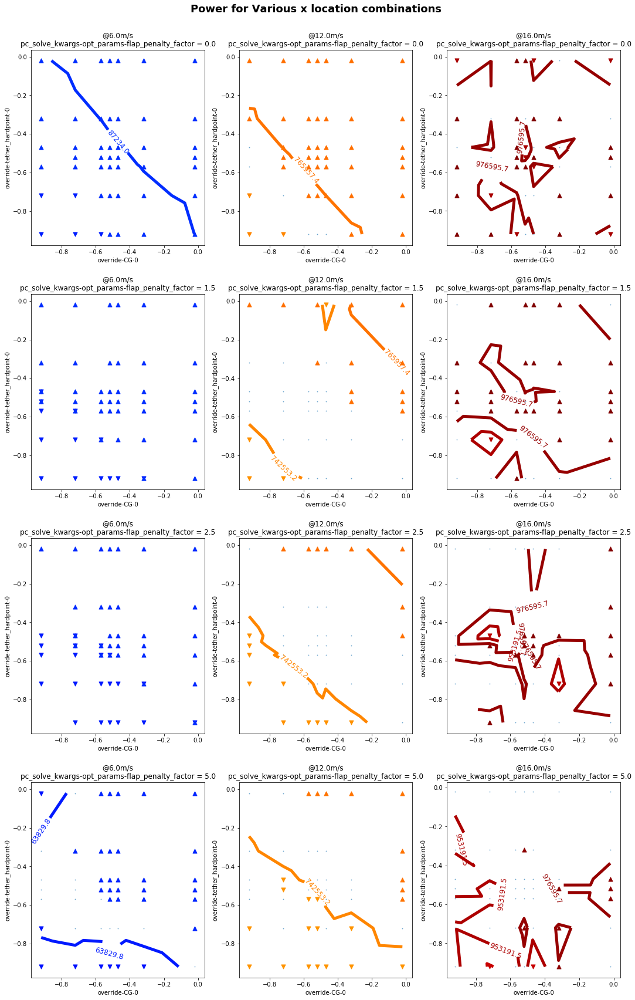

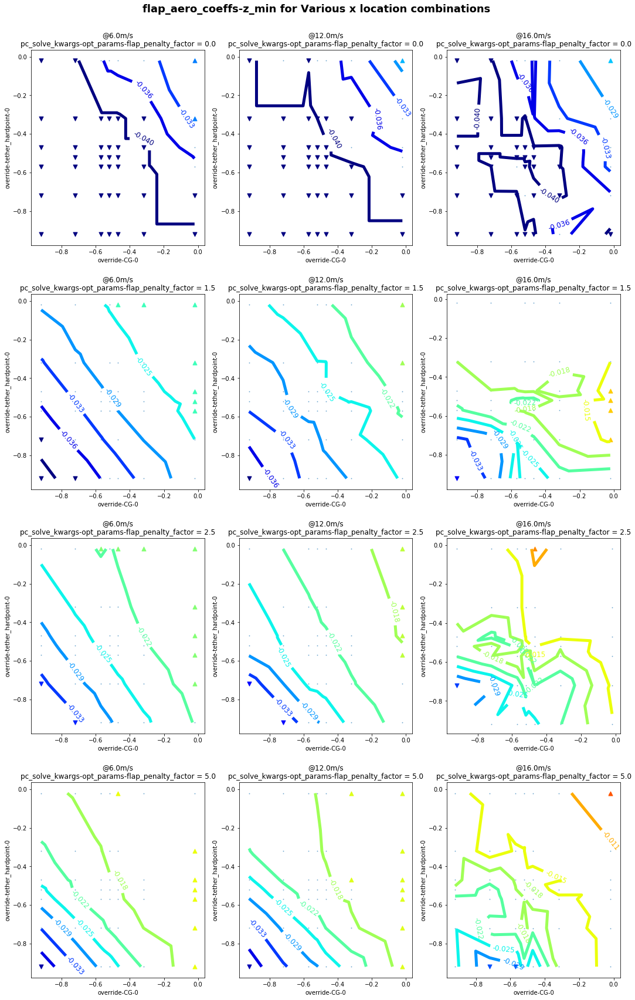

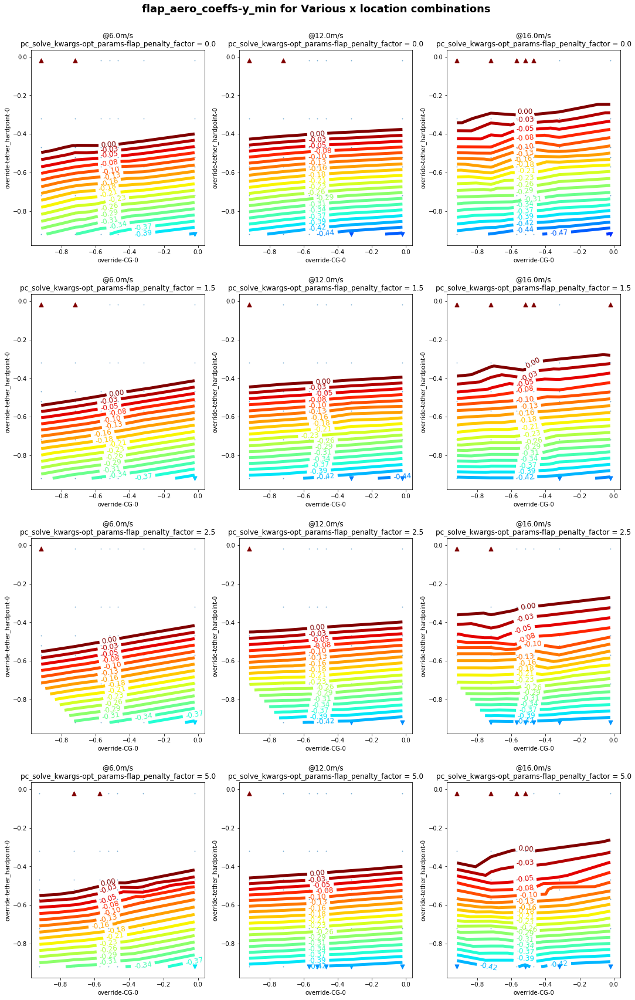

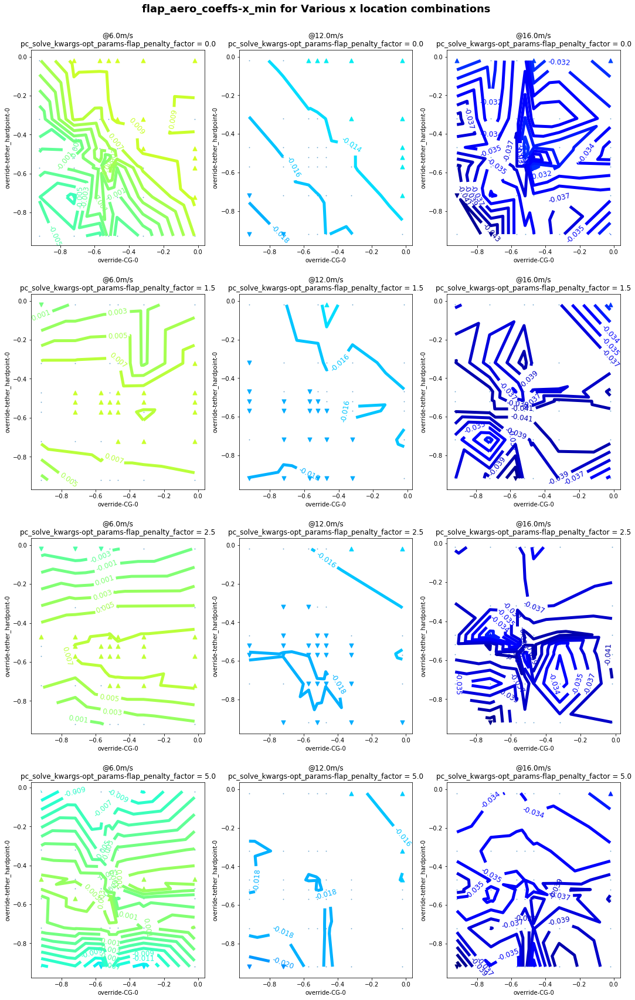

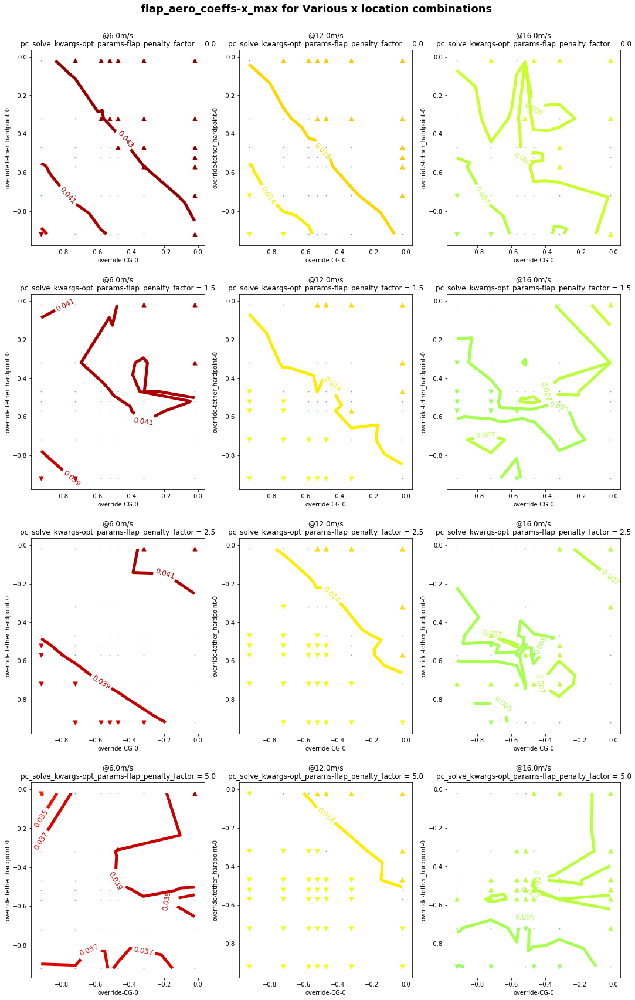

In [ ]:
#@title Plot PC Data by Batch, x_CG_HP {form-width:"30%"}

#@markdown Suffix is appended to kite name for image saving.
#@markdown Typically should be '-\<path_type>' or similar. <br><br>
#@markdown If you want plots to auto-populate in Comparison notebook, it MUST
#@markdown match the \<kite_name\>-\<path_type\> format of the desired config in
#@markdown the comparison notebook.

pc_suffix = '-circle' #@param {type: 'string'}
export_plots = True #@param {type: 'boolean'}
_save_location = pcs_subdir if export_plots else None
batch_ids = ['x_CG_HP'] #@param 

dry_run = False #@param {type: 'boolean'}
only_all_valid = True #@param {type: 'boolean'}
show_points = True #@param {type: 'boolean'} 
subplots_adjust_kwargs = {'top': 0.935, 'bottom': 0.02, 'hspace': 0.25} #@param 
suptitle_kwargs = {'fontsize': 18} #@param 
wind_speeds = [6., 12., 16.]
figsize=(6,6)
peak_kwargs = {'s': 50}

re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=figsize, plot_dims=(0,1),
    suptitle=('Power for Various x location combinations'),
    suptitle_kwargs=suptitle_kwargs,
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    pc_var_to_plot=None,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('power', wind_speeds),
    color_dim=None, subplot_dim=2,
    levels=np.linspace(-100000., 1000000., 48),
    show_points=show_points, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 12},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs, peak_tol=10000.,
    export_range_name='x-HP-CG,flap_penalty',
    export_var_name='power,vws',
    )
re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=figsize, plot_dims=(0,1),
    suptitle=('flap_aero_coeffs-z_min for Various x location combinations'),
    suptitle_kwargs=suptitle_kwargs,
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    pc_var_to_plot=None,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('flap_aero_coeffs-z_min', wind_speeds),
    color_dim=None, subplot_dim=2,
    levels=np.linspace(-0.04, 0.0, 12),
    show_points=show_points, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 12, 'fmt': '%0.3f'},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs, peak_tol=0.002,
    export_range_name='x-HP-CG,flap_penalty',
    export_var_name='flap_aero_coeffs-z_min,vws',
    )
re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=figsize, plot_dims=(0,1),
    suptitle=('flap_aero_coeffs-y_min for Various x location combinations'),
    suptitle_kwargs=suptitle_kwargs,
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    pc_var_to_plot=None,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('flap_aero_coeffs-y_min', wind_speeds),
    color_dim=None, subplot_dim=2,
    levels=np.linspace(-0.6, 0.0, 24),
    show_points=show_points, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 12, 'fmt': '%0.2f'},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs, peak_tol=0.02,
    export_range_name='x-HP-CG,flap_penalty',
    export_var_name='flap_aero_coeffs-y_min,vws',
    )
re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=figsize, plot_dims=(0,1),
    suptitle=('flap_aero_coeffs-x_min for Various x location combinations'),
    suptitle_kwargs=suptitle_kwargs,
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    pc_var_to_plot=None,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('flap_aero_coeffs-x_min', wind_speeds),
    color_dim=None, subplot_dim=2,
    levels=np.linspace(-0.045, 0.045, 48),
    show_points=show_points, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 12, 'fmt': '%0.3f'},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs, peak_tol=0.001,
    export_range_name='x-HP-CG,flap_penalty',
    export_var_name='flap_aero_coeffs-x_min,vws',
    )
re_processor.plot_pc_data_by_batch(
    batch_ids=batch_ids,
    figsize=figsize, plot_dims=(0,1),
    suptitle=('flap_aero_coeffs-x_max for Various x location combinations'),
    suptitle_kwargs=suptitle_kwargs,
    subplots_adjust_kwargs=subplots_adjust_kwargs,
    pc_var_to_plot=None,
    # cmaps=['Reds', 'Blues', 'Greens', 'Purples', 'Greys'],
    loop_var_to_plot=('flap_aero_coeffs-x_max', wind_speeds),
    color_dim=None, subplot_dim=2,
    levels=np.linspace(-0.045, 0.045, 48),
    show_points=show_points, dry_run=dry_run,
    contour_kwargs={'linewidths':5},
    values_kwargs={'fontsize': 12, 'fmt': '%0.3f'},
    plot_save_location=_save_location, pc_suffix=pc_suffix,
    only_all_valid=only_all_valid,
    peak_kwargs=peak_kwargs, peak_tol=0.001,
    export_range_name='x-HP-CG,flap_penalty',
    export_var_name='flap_aero_coeffs-x_max,vws',
    )

In [ ]:
for ii, j in enumerate(re_processor.jobs):
  if j.result['batch_id'] == 'x_CG_HP':

    print((ii, j.result['batch_id'], j.result['success'], j.result['data']['pc']['AEP'] if 'AEP' in j.result['data']['pc'] else None))


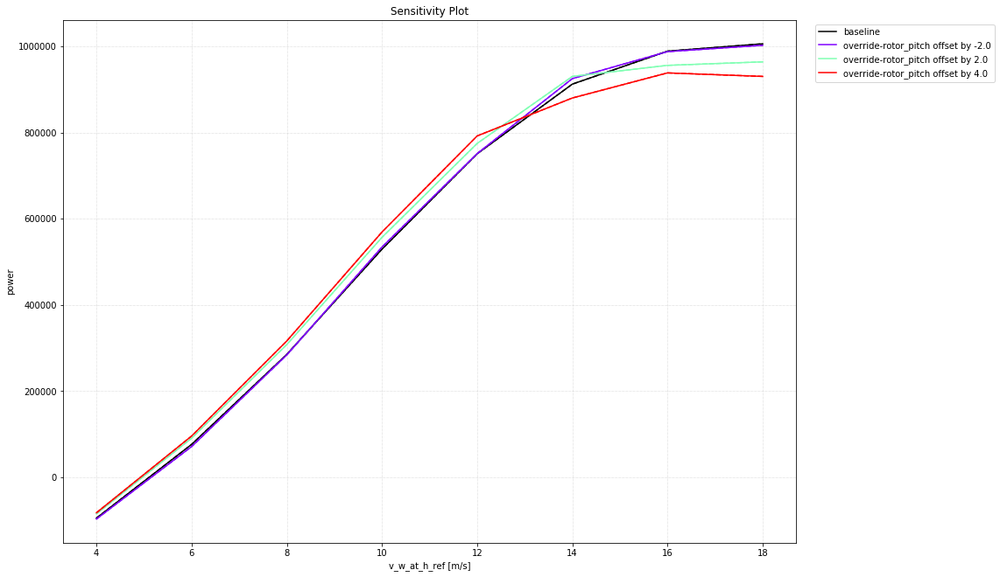

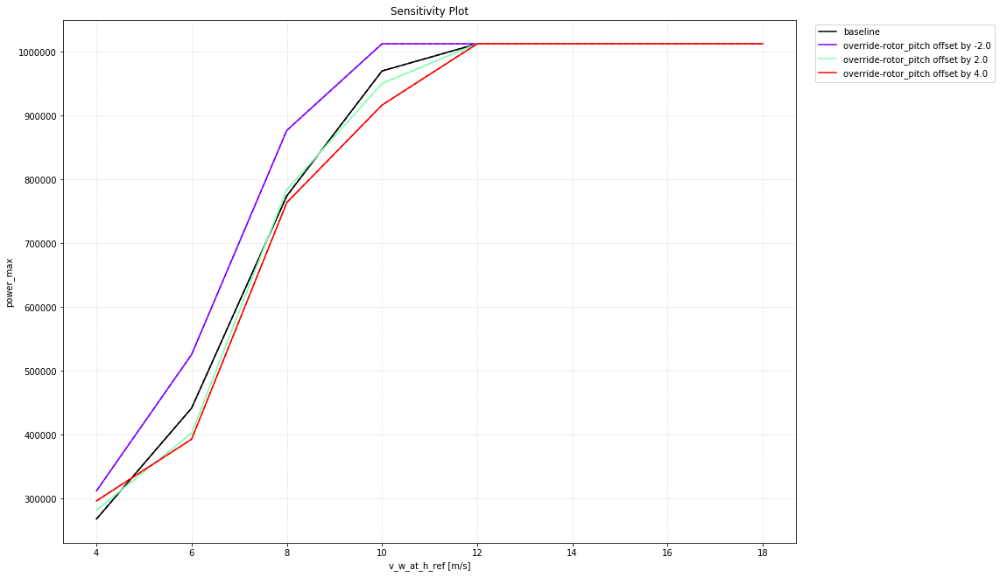

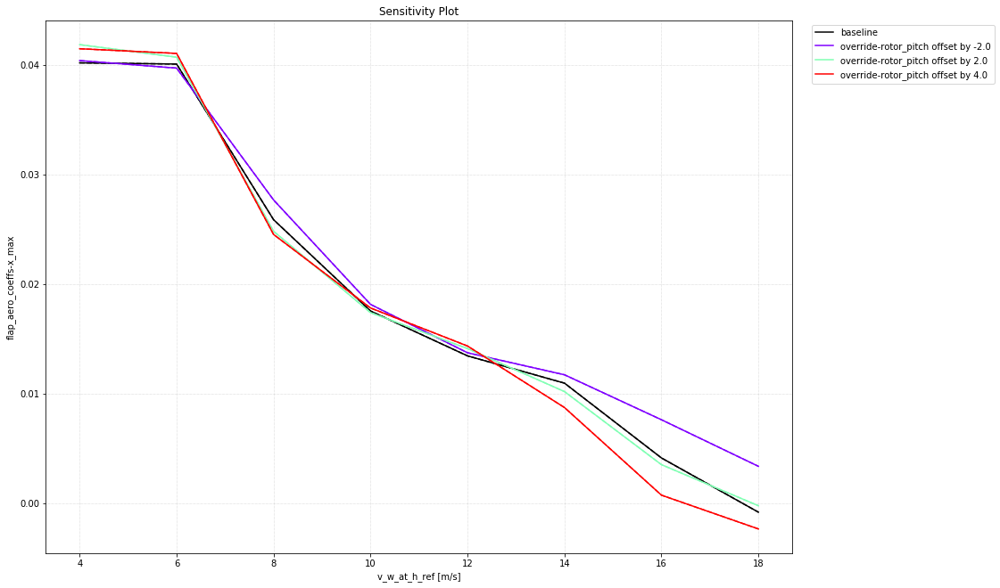

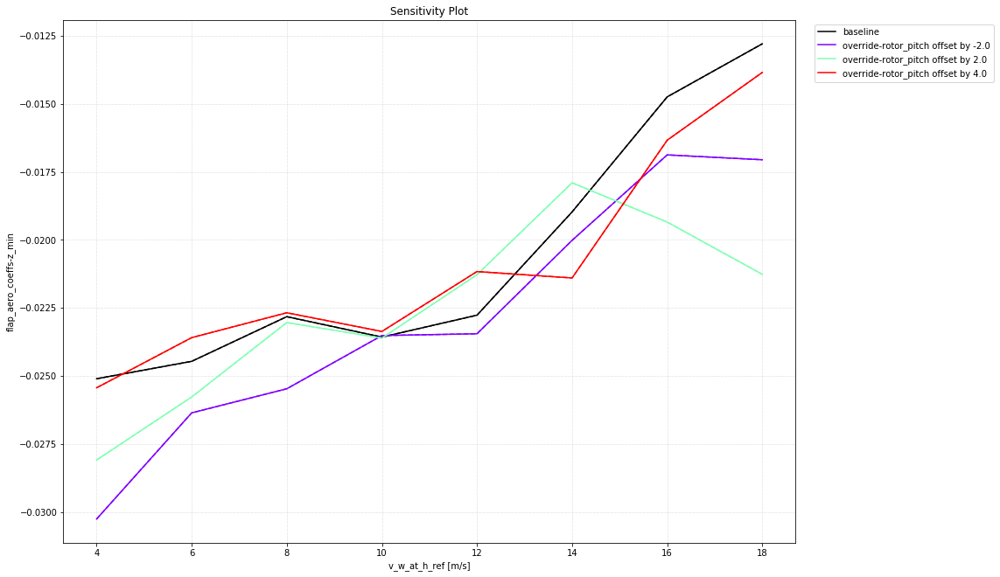

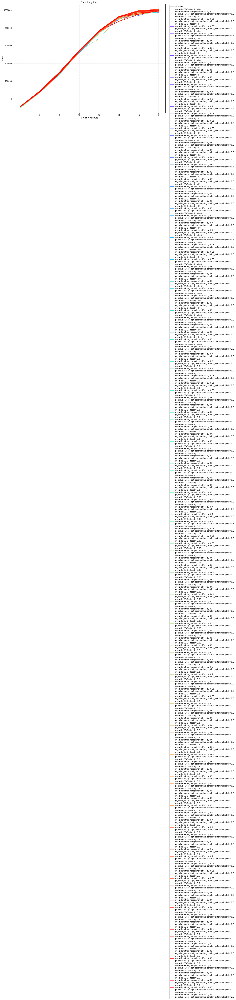

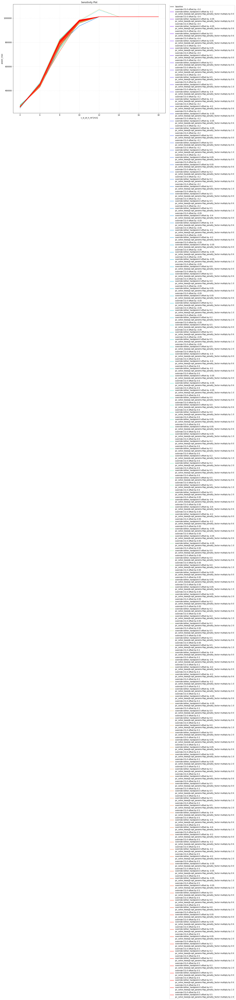

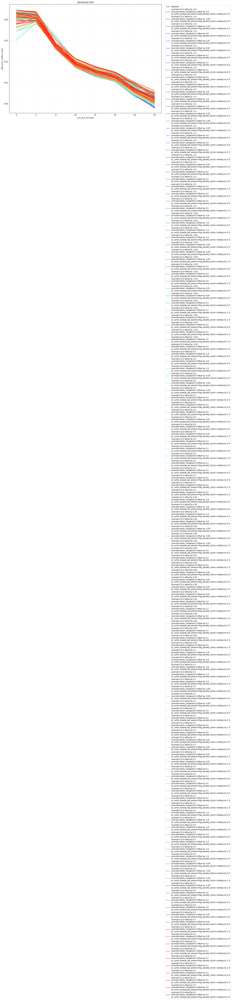

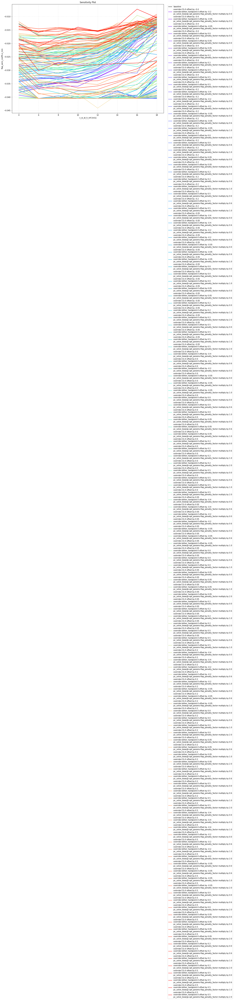

In [ ]:
#@title Plot Loop Data by Batch
#@markdown Note: can only plot things that are stored as specified above, and a 
#@markdown scalar for each wind speed, typically the loop_vars_to_store from
#@markdown above, or the equivalent pc_vars_to_store.

#@markdown Suffix is appended to kite name for image saving.
#@markdown Typically should be '-\<path_type>' or similar.
pc_suffix = '-circle' #@param {type: 'string'}
export_plots = False #@param {type: 'boolean'}
_save_location = pcs_subdir if export_plots else None

dry_run = False #@param {type: 'boolean'}

# vars_to_plot = ['power'] #@param 
vars_to_plot = ['power', 'power_max', 'flap_aero_coeffs-x_max', 'flap_aero_coeffs-z_min'] #@param 

# processor.plot_job_loop_data_by_batch(
re_processor.plot_job_loop_data_by_batch(
    vars_to_plot=vars_to_plot,
    dry_run=dry_run, pc_suffix=pc_suffix,
    plot_save_location=_save_location,
    figsize=(15,11),
    colormap='rainbow',
    min_AEP=3200.,
    )


In [ ]:
dir(processor)
list(processor.collated_results.keys())
processor.collated_results['bridle_sweep']['data'][0]['pc']['AEP']
processor.collated_results['bridle_sweep']['data']
# processor.collated_results['baseline']['data'][0]['pc']['AEP']


# WIP

In [ ]:
assert False


In [ ]:
#@title Plot Derivatives
#@markdown INCOMPLETE, DO NOT USE
def plot_derivatives(
    overrides_varied_output, vars_to_plot=['power_avg_time']):
  for key_s, override_varied in sorted(six.iteritems(out['overrides_varied_output'])):

    vary_range = override_varied['range']
    vary_type = override_varied['type']
    overrides = override_varied['overrides']

    center = 1. if vary_type=='multiply' else 0.
    max_var = max(np.abs(np.array(vary_range) - center))
    range_norm = [(x - center)/(2. * max_var) + 0.5 for x in vary_range]
    idx_center = vary_range.index(center)

    if six.ensure_str(key_s).find('-') != -1:
      key, suffix = key_s.split['-']
    else:
      key, suffix = key_s, ''

    for var in vars_to_plot:
      text = ''
      plt.figure(figsize=(8,6))
      plt.title('Power Curves')
      plt.xlabel('v_w_at_h_ref [m/s]')
      plt.ylabel(var)
      for ii, v in enumerate(vary_range):
        denom = ((overrides[idx_center][key])
          - np.linalg.norm(kites[kite_name][var_name]))
        if denom != 0.:
          numerator = np.array(pc.powers) - np.array(nom_pc.powers)
        plt.plot(override_varied['v_w_at_h_ref'][ii], override_varied[var][ii],
                  color=cm.coolwarm(range_norm[ii]),
                  label='varied '+ six.ensure_str(key) +' by ' + six.ensure_str(vary_type[0]) + six.ensure_str(str(v)))
      lgd = plt.legend(bbox_to_anchor=(1.02, 1.), loc=2)
      plt.grid(linestyle=':', linewidth=0.5)
    
    # plot_dir = os.path.join(pcs_subdir, 'plots')

    # if not os.path.exists(plot_dir):
    #   os.mkdir(plot_dir)
    
    # with open(plot_dir + '/' + var_name + '.png', 'w') as f:
    #   plt.savefig(f, bbox_extra_artists=(lgd,), bbox_inches='tight')
    plt.show()
    plt.close()

for var_name in sorted(pcs):
  if var_name not in ['c', 'b']:
    var_sweep = pcs[var_name]
    plt.figure(figsize=(8,6))
    plt.title(six.ensure_str(var_name) + ' Sensitivity in Crosswind')
    plt.xlabel('v_w_at_h_ref [m/s]')
    plt.ylabel('d_power / d_' + six.ensure_str(var_name) + ' [W/<unit_'+six.ensure_str(var_name)+'>]')
    for var in sorted(var_sweep):
      pc = var_sweep[var]
      text = ''
      if var != 1.0:
        if hasattr(kites[kite_name][var_name], '__call__'):
          denom = var - 1.0
          text = 'Is function, unit is multiplier.'
        else:
          denom = (
              var * np.linalg.norm(kites[kite_name][var_name])
              - np.linalg.norm(kites[kite_name][var_name]))
        if denom != 0.:
          numerator = np.round(
              np.array(pc.powers) - np.array(nom_pc.powers), -3)
          plt.plot(pc.v_ws_at_h_ref,
                  (numerator / denom),
                  color=cm.coolwarm(range_norm(var)),
                  label='varied ' + six.ensure_str(var_name) + ' by '+ six.ensure_str(str(var)))
          plt.text(0.5, -0.15, text,
            fontsize=10, transform=plt.gca().transAxes, ha='center')
        else:
          print(('Skipped %s, denominator was zero.' % var_name))
      lgd = plt.legend()
      plt.grid(linestyle=':', linewidth=0.5)


In [ ]:
#@title Overall Sensitivity
#@markdown INCOMPLETE, DO NOT USE
LCOE_derivs = {}
for k, v in six.iteritems(LCOE_sensitivities):
  idx_mid = v.index(1.0)
  numerator = v[idx_mid + 1] - v[idx_mid - 1]
  upper = range_to_vary[idx_mid + 1]
  lower = range_to_vary[idx_mid - 1]
  denom = (
      upper * np.linalg.norm(kites[kite_name][k])
      - lower * np.linalg.norm(kites[kite_name][k]))
  print((k, numerator, denom, numerator / denom))
  LCOE_derivs[k] = numerator / denom


In [ ]:
#@title LCOE & Cap Fac Plots
#@markdown INCOMPLETE, DO NOT USE
# lines = ["-","--","-.",":"]
# linecycler = itertools.cycle(lines)

# plt.figure(figsize=(6, 6), dpi= 100, facecolor='w', edgecolor='w')
# plt.xlabel('Relative change to variable')
# plt.ylabel('Relative change to LCOE')
# plt.title('Direct effect of Inputs to Power Curve')
# for key, value in LCOE_sensitivities.iteritems():
#     plt.plot(range_to_vary, value, next(linecycler), label=key)
    
# plt.legend(loc=(1.02,0.1))
# plt.grid(linestyle=':', linewidth=0.5)

# plt.figure(figsize=(6, 6), dpi= 100, facecolor='w', edgecolor='w')
# plt.xlabel('Relative change to variable')
# plt.ylabel('Relative change to LCOE')
# plt.title('Direct effect of Inputs to Power Curve (zoomed)')
# plt.ylim((0.9, 1.1))
# for key, value in LCOE_sensitivities.iteritems():
#     plt.plot(range_to_vary, value, next(linecycler), label=key)
    
# plt.legend(loc=(1.02,0.1))
# plt.grid(linestyle=':', linewidth=0.5)

# lines = ["-","--","-.",":"]
# linecycler = itertools.cycle(lines)
# plt.figure(figsize=(6, 6), dpi= 100, facecolor='w', edgecolor='w')
# plt.xlabel('Relative change to variable')
# plt.ylabel('Relative change to Capacity Factor')
# plt.title('Direct effect of Inputs to Power Curve')
# for key, value in cap_factor_sensitivities.iteritems():
#     plt.plot(range_to_vary, value, next(linecycler), label=key)
    
# plt.legend(loc=(1.02,0.1))
# plt.grid(linestyle=':', linewidth=0.5)


In [ ]:
for k in sorted(LCOE_derivs.keys()):
  print(k)

for k, v in sorted(six.iteritems(LCOE_derivs)):
  print(v)


In [ ]:
def plot_paths(pc, **kwargs):
  figsize = kwargs.get('figsize', (6,6))
  fig = kwargs.get('fig', None)
  if not fig:
    fig, ax = plt.subplots(figsize=figsize)
  ax = fig.get_axes()[0]

  path_colors = [plt.cm.rainbow(x) for x in
      np.linspace(0., 1., len(pc.loops))]
  for loop, path_color in zip(pc.loops, path_colors):
      fig = plot_path_positions(loop, fig=fig, path_color=path_color, **kwargs)
  ax.legend(bbox_to_anchor=(1.01, 1.), loc=2)
  ax.set_title('Crosswind Plane Paths & Poses for Each Wind Speed')
  return fig

def plot_path_positions(loop, **kwargs):
  fig = kwargs.get('fig', None)
  figsize = kwargs.get('figsize', (7, 7))
  label = kwargs.get('label', '{} m/s'.format(loop.v_w_at_h_ref))
  path_color = kwargs.get('path_color', 'black')
  with_azim_incl = kwargs.get('with_azim_incl', False)

  colors = utils.set_rainbow_plot_cycler(n=loop.num_poses)
  if not fig:
    fig, ax = plt.subplots(figsize=figsize)
  ax = fig.get_axes()[0]

  xs = loop.path['crosswind_xy'].T[0]
  ys = loop.path['crosswind_xy'].T[1]
  if with_azim_incl:
    # Simple Mercator projection of centroid locations,
    # will distort centroid locations to show them further from each other
    # than they really are.
    xs = xs - loop.path_location_params['azim'] * loop.config['l_tether']
    ys = ys + loop.path_location_params['incl'] * loop.config['l_tether']
    ax.set_title('Crosswind Plane Path & Poses,'
        ' with approximate azim and incl.')
    ax.axvline(linewidth=1, label=None, c='gray', zorder=0)
    ax.axhline(linewidth=1, label=None, c='gray', zorder=0)
  else:
    ax.set_title('Crosswind Plane Path & Poses')
    ax.scatter(0, 0, marker='+', c='k', s=250, label=None)

  ax.plot(xs, ys, c=path_color, linewidth=5, linestyle='-', label=label, zorder=1)
  # ax.quiver(xs[-1], ys[-1], xs[0]-xs[-1], ys[0]-ys[-1],
  #       angles='xy', scale_units='xy', scale=1.,
  #       linestyle='--', label=None, zorder=1)
  # ax.scatter(xs, ys, s=75, c=colors, zorder=2)
  ax.grid(linewidth=1, linestyle=':')
  ax.axis('equal')
  if with_azim_incl:
    ax.set_ylim((-10, loop.config['l_tether'] * np.pi / 3))

  plt.rcdefaults()
  return fig
